## NEURAL NETWORKS AND DEEP LEARNING
---
# Homework 1 - Supervised Deep Learning
### A.A. 2020/21 (6 CFU) - Dr. Alberto Testolin, Dr. Matteo Gadaleta
---

Segalini Beatrice, student ID 1234430

> M.Sc. PHYSICS OF DATA
>
> Department of Physics and Astronomy
 
-----

# Regression task

## Guidelines

* The goal is to train a neural network to approximate an unknown function:
$$ 
f:\mathbb{R}→\mathbb{R} \\
x↦y=f(x) \\
\text{network}(x) \approx f(x)
$$
* As training point, you only have noisy measures from the target function.
$$
\hat{y} = f(x) + noise
$$
* Consider to create a validation set from you training data, or use a k-fold cross-validation strategy. You may find useful these functions from the `scikit-learn` library:
    - [train_test_split](https://scikit-learn.org/stable/modules/generated/sklearn.model_selection.train_test_split.html)
    - [KFold](https://scikit-learn.org/stable/modules/generated/sklearn.model_selection.KFold.html#sklearn.model_selection.KFold) 

## Dataset

In [1]:
import pandas as pd
import numpy as np

from sklearn.model_selection import KFold
from scipy.stats import loguniform 

import matplotlib.pyplot as plt
%matplotlib inline

import torch
import torch.nn as nn
import torch.optim as optim
from torch.utils.data import Dataset, DataLoader
from torchvision import transforms
from torch.autograd import Variable
import torch.nn.functional as F
import torch.utils.data as Data

import imageio

from rich.jupyter import print
from tqdm import tqdm

# reproducibility, use Student ID as seed
torch.manual_seed(1234430)    
np.random.seed(1234430)

The following cell of code will download the dataset and make it available in the local folder `regression_dataset`. There are two files:

* `regression_dataset/train_data.csv`
* `regression_dataset/test_data.csv`

Use them to train and test your model. Each row contains two values, respactively the input and the target (label).

In [2]:
#!wget -P regression_dataset https://gitlab.dei.unipd.it/gadaleta/nnld-2020-21-lab-resources/-/raw/master/homework_1_regression_dataset/train_data.csv
#!wget -P regression_dataset https://gitlab.dei.unipd.it/gadaleta/nnld-2020-21-lab-resources/-/raw/master/homework_1_regression_dataset/test_data.csv 

How to load the data:

In [3]:
train_df = pd.read_csv('regression_dataset/train_data.csv')
test_df  = pd.read_csv('regression_dataset/test_data.csv')

How to get a specific sample:

In [4]:
sample_index = 13
input = train_df.iloc[sample_index]['input']
label = train_df.iloc[sample_index]['label']

print(f"SAMPLE AT INDEX {sample_index}")
print(f"INPUT: {input}")
print(f"LABEL: {label}")

All training points:

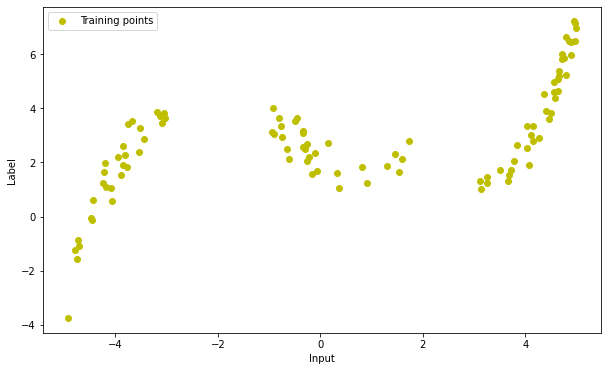

In [5]:
fig = plt.figure(figsize=(10,6))
plt.scatter(train_df.input, train_df.label, c='y', label='Training points')
plt.xlabel('Input')
plt.ylabel('Label')
plt.legend()
plt.show()

### Prepare datasets

In [6]:
class CsvDataset(Dataset):

    def __init__(self, dataframe, transform=None):
        '''Args:
            csv_file (string): Path to the csv file.
            transform (callable, optional): Optional transform to be applied
                on a sample.
        '''
        self.transform = transform
        # read the dataframe file 
        self.data = dataframe
        # get columns names 
        self.names = np.array( dataframe.columns )
        
    def __len__(self):
        # The length of the dataset is simply the length of the self.data list
        return len(self.data)

    def __getitem__(self, idx):
        # get item given idx, following code above
        sample = ( self.data.iloc[idx][self.names[0]], self.data.iloc[idx][self.names[1]] )
        if self.transform:
            sample = self.transform(sample)
        return sample

In [7]:
class ToTensor(object):
    """Convert sample to Tensors."""

    def __call__(self, sample):
        x, y = sample
        return (torch.tensor([x]).float(),
                torch.tensor([y]).float())

In [8]:
composed_transform = transforms.Compose([ToTensor()])

train_dataset = CsvDataset(train_df, transform=composed_transform)
test_dataset  = CsvDataset(test_df, transform=composed_transform)

## Setting up the main network structure

In [9]:
class Net(nn.Module):
    '''
    Module including network structure and functioning, basic training, testing and validating operations.
    '''
    def __init__(self, Ninp, Nhi1, Nhi2, Nout, drop=0.15):
        '''
        The network implemented is a simple one with 2 fully connected hidden layers.
        
        Ninp: input size
        Nhi1: size of the first hidden layer
        Nhi2: size of the second hidden layer
        Nout: output size
        drop: dropout probability
        '''
        super(Net, self).__init__()     #initialize
        
        self.hl1 = nn.Linear(Ninp, Nhi1)  #1st hidden layer
        self.dr1 = nn.Dropout(drop)       #dropout
        self.hl2 = nn.Linear(Nhi1, Nhi2)  #2nd hidden layer
        self.out = nn.Linear(Nhi2, Nout)  #output layer
        self.act = nn.ReLU()              #activation function

        print('Network initialized')
    
    def forward(self, x):
    
        x_1 = self.act(self.hl1(x))    #first layer 
        x_1 = self.dr1(x_1)            #first dropout
        x_2 = self.act(self.hl2(x_1))  #second layer 
        x_2 = self.dr1(x_2)            #second dropout
        x   = self.out(x_2)            #output layer
        
        return x
    
    def train_step(self, train_loader, optimizer, loss_func, device, epoch):
        """
        Define the basic train step.
        
        train_loader: dataloader
        optimizer:    type of selected optimizer (SGD, Adam...)
        loss_func:    selected loss function
        device:       gpu (if available) or cpu
        epoch:        number of epoch in training process
        
        Return: training loss.
        """
        
        train_loss = []  #initialize vector containing training losses
        self.train()     #set training mode
        
        for ii, s_batch in enumerate(train_loader):
            
            x_batch = s_batch[0].to(device)       #import data, move to device 
            label_b = s_batch[1].to(device)       #import labels, move to device
            
            for_out = self.forward(x_batch)       #forward pass
            
            tr_loss = loss_func(for_out, label_b) #compute loss
        
            self.zero_grad()                      #back-propagation
            tr_loss.backward()
            
            optimizer.step()                      #weights update
                
            ba_loss = tr_loss.detach().cpu().numpy()
            train_loss.append(ba_loss)            #save loss for batch
            
        return train_loss
    
    def train_step_plot(self, train_loader, optimizer, loss_func, device, epoch):
        """
        Define the basic train step.
        
        train_loader: dataloader
        optimizer:    type of selected optimizer (SGD, Adam...)
        loss_func:    selected loss function
        device:       gpu (if available) or cpu
        epoch:        number of epoch in training process
        plot_things:  if True, save images for producing a .gif of the training process 
        
        Return: training loss.
        """
        
        train_loss = []  #initialize vector containing training losses
        self.train()     #set training mode
        train_img  = []  #empty list of training images. Will remain empty if plot_things=False
        
        for ii, s_batch in enumerate(train_loader):
            
            x_batch = s_batch[0].to(device)       #import data, move to device 
            label_b = s_batch[1].to(device)       #import labels, move to device
            
            for_out = self.forward(x_batch)       #forward pass
            
            tr_loss = loss_func(for_out, label_b) #compute loss
        
            self.zero_grad()                      #back-propagation
            tr_loss.backward()
            
            optimizer.step()                      #weights update
            
            if ( ii == 1 ):
                fig, ax = plt.subplots(figsize=(16,10))

                # plot and show learning process
                plt.cla()
                ax.set_title('Regression Analysis', fontsize=35)
                ax.set_xlabel('x', fontsize=24)
                ax.set_ylabel('f(x)', fontsize=24)
                ax.set_xlim(-5, 5)
                ax.set_ylim(-5, 10)

                ax.scatter(x_batch.data.numpy(), label_b.data.numpy(), color = 'y')
                ax.scatter(x_batch.data.numpy(), for_out.data.numpy(), color = 'r', marker = 'x')
                ax.text(1, -3, 'Epoch = %d' % epoch,
                        fontdict={'size': 24, 'color':  'black'})
                ax.text(1, -4, 'Loss = %.4f' % tr_loss.data.numpy(),
                        fontdict={'size': 24, 'color':  'black'})

                # Used to return the plot as an image array 
                # (https://ndres.me/post/matplotlib-animated-gifs-easily/)
                fig.canvas.draw()       # draw the canvas, cache the renderer
                train_img = np.frombuffer(fig.canvas.tostring_rgb(), dtype='uint8')
                train_img = train_img.reshape(fig.canvas.get_width_height()[::-1] + (3,))
                plt.close(fig)
                
            ba_loss = tr_loss.detach().cpu().numpy()
            train_loss.append(ba_loss)            #save loss for batch
            
        return train_loss, train_img
    
    def val_step(self, valid_loader, loss_func, device):
        """
        Define basic validation step.
        
        valid_loader: dataloader
        loss_func:    selected loss function
        device:       gpu (if available) or cpu
        
        Return: validation loss.
        """
        val_loss = [] #initialize vector containing validation losses
        self.eval()   #set evaluation mode
        
        with torch.no_grad():                         #disable gradient tracking
            for s_batch in valid_loader:
                
                x_batch = s_batch[0].to(device)       #import data, move to device
                label_b = s_batch[1].to(device)       #import labels, move to device
            
                for_out = self.forward(x_batch)       #forward pass

                va_loss = loss_func(for_out, label_b) #compute loss

                ba_loss = va_loss.detach().cpu().numpy()
                val_loss.append(ba_loss)           #save loss for batch
        
        return val_loss
    
    def fitting(self, train_loader, val_loader, optimizer, loss_func, param, plot_things):
        '''
        Define training process.
        
        train_loader: train set dataloader 
        valid_loader: validation set dataloader
        optimizer:    selected optimizer 
        loss_func:    selected loss function
        param:        dictionary containing the rest of the parameters
        plot_things:  if True, saves images for producing a .gif of the fitting process
        
        
        Return: train and validation losses.
        '''
        
        train_loss_log = [] 
        val_loss_log = []
        my_images = []
        
        for epoch in tqdm(range(param['num_epochs'])):
            # Training
            if plot_things:
                train_loss, train_img = self.train_step_plot(train_loader, optimizer, loss_func, 
                                                             param['device'], epoch)
                my_images.append(train_img)
            else:
                train_loss = self.train_step(train_loader, optimizer, loss_func, 
                                             param['device'], epoch)
                
            # Compute and store average training loss
            train_loss = np.mean(train_loss)
            train_loss_log.append(train_loss)
            
            # Print every 10 epochs the average train loss
            # if epoch%10==0: print(f"AVERAGE TRAIN LOSS: {train_loss}")
            
            # Validation 
            valid_loss = self.val_step(val_loader, loss_func, param['device'])
            
            # Compute and store average validation loss
            valid_loss = np.mean(valid_loss)
            val_loss_log.append(valid_loss)
            
            # Print every 10 epochs the average train loss
            # if epoch%10==0: print(f"AVERAGE VAL LOSS: {valid_loss}")
            
        return train_loss_log, val_loss_log, my_images
    
    def predicting(self, data_loader, device):
        '''
        Compute and returns predicted labels.
        '''              
                
        predicts = [] #initialize vector containing predictions
        self.eval()   #set evaluation mode
        
        with torch.no_grad():                   #disable gradient tracking
            for s_batch in data_loader:
                
                x_batch = s_batch[0].to(device) #import data, move to device
                
                for_out = self.forward(x_batch) #forward pass

                outputs = for_out.cpu().numpy()
                predicts.append(outputs)        #save predictions
        
        return np.array(predicts)
                
    def testing(self, test_loader, loss_func, device):
        '''
        Define testing procedure.
        
        test_loader: test set dataloader 
        loss_func:   selected loss function
        device:      gpu (if available) or cpu
        
        Return: test accuracy.        
        '''
        
        accuracy = [] #initialize vector containing accuracies
        self.eval()   #set evaluation mode
        
        with torch.no_grad():                         #disable gradient tracking
            for s_batch in tqdm(test_loader):
                
                x_batch = s_batch[0].to(device)       #import data, move to device
                label_b = s_batch[1].to(device)       #import labels, move to device !!![1][0]????
            
                for_out = self.forward(x_batch)       #forward pass
                
                te_loss = loss_func(for_out, label_b) #compute batch loss, save it
                ba_loss = te_loss.detach().cpu().numpy()
                
                accuracy.append(ba_loss.mean())       #store batch accuracy
        
        return np.array(accuracy).mean()
        

### Define dataloaders

In [10]:
# train dataloader
train_dataloader = Data.DataLoader(train_dataset, batch_size=10, shuffle=True, num_workers=0)

# test dataloader
test_dataloader  = Data.DataLoader(test_dataset, batch_size=len(test_dataset), shuffle=False, num_workers=0)

### Network example

In [11]:
Ninp = 1
Nhi1 = 50
Nhi2 = 100
Nout = 1

net = Net(Ninp, Nhi1, Nhi2, Nout, 0.02)
print(net)

# Define optimizer
optimizer = optim.Adam(net.parameters(), lr=1e-3)

# Define loss function
loss_func = nn.MSELoss()  

device = torch.device("cuda") if torch.cuda.is_available() else torch.device("cpu")
                                # Check if the GPU is available

params = {'num_epochs': 200, 'device': device}


In [12]:
train_loss, val_loss, my_images = net.fitting(train_dataloader, test_dataloader, optimizer, 
                                              loss_func, params, plot_things=True)

100%|████████████████████████████████████████████████████████████████████████████████| 200/200 [00:43<00:00,  4.62it/s]


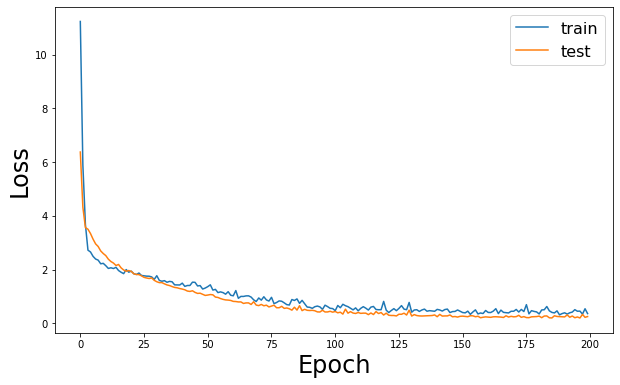

In [13]:
fig, ax = plt.subplots(figsize=(10,6))

ax.set_xlabel('Epoch', fontsize=24)
ax.set_ylabel('Loss', fontsize=24)

plt.plot(train_loss, label='train')
plt.plot(val_loss, label='test')
plt.legend(fontsize=16)

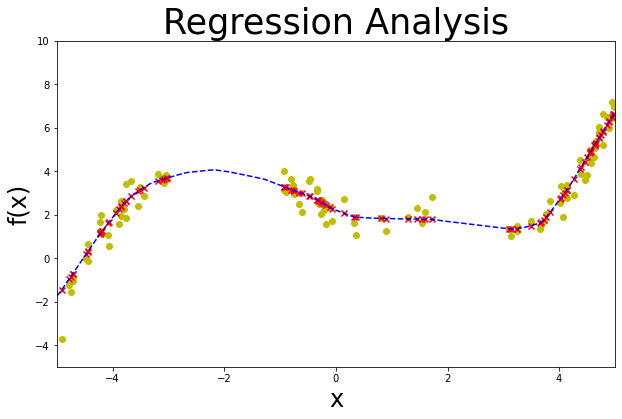

In [14]:
# training dataset: convert to tensors and use Variable from torch.autograd
x = torch.unsqueeze(torch.tensor(train_df.input), dim=1).float()
y = torch.unsqueeze(torch.tensor(train_df.label), dim=1).float()

x, y = Variable(x), Variable(y)

# for plotting the predicted function
x_pred = torch.linspace(-5,5,1000)
x_pred = x_pred.to(device)
x_pred = x_pred.unsqueeze(-1)

net.to(device)

fig, ax = plt.subplots(figsize=(10,6))

plt.cla()
ax.set_title('Regression Analysis', fontsize=35)
ax.set_xlabel('x', fontsize=24)
ax.set_ylabel('f(x)', fontsize=24)
ax.set_xlim(-5, 5)
ax.set_ylim(-5, 10)

ax.scatter(train_df.input, train_df.label, color = 'y')
prediction = net(x)     # input x and predict based on x
# Network output
with torch.no_grad():
    y_pred = net(x_pred)

ax.plot(x_pred.squeeze().cpu().numpy(), y_pred.squeeze().cpu().numpy(), 'b--')
ax.scatter(x.data.numpy(), prediction.data.numpy(), color = 'r', marker = 'x')
plt.savefig('test_fitting_2.png')
plt.show()


In [15]:
# save images as a gif    
imageio.mimsave('./test_fitting.gif', my_images, fps=20)

## Finding the best network

In [16]:
params = {"device"        : [device],
          "batch_size"    : [10, 16, 32, 64],
          "dropout"       : np.random.uniform(0, 0.25, 500),
          "num_epochs"    : [100, 250, 500],
          "learning_rate" : loguniform.rvs(-5, -2, size=500),
          "optimizer"     : ['sgd', 'adam'],
          "Nhi1"          : [20, 50, 100],
          "Nhi2"          : [100, 200, 300], 
          "reg_param"     : loguniform.rvs((-5, -3, size=500),
          }

In [17]:
def reset_weights(network):
    '''
    Function to reset model weights to prevent weight leakage.
    
    network: the model.
    '''

    for layer in network.children():
        if hasattr(layer, 'reset_parameters'):
            print('Reset trainable parameters of layer =', layer)
            layer.reset_parameters()

def random_params(params):
    selected_params = {}
    for i in params.keys():
        selected_params[i] = np.random.choice( params[i] )
    return selected_params

In [18]:
def cross_valid(grid_par, dataset, num_folds=5, n_models=1):
    '''
    Cross validation method for selecting optimal parameters through random search.
    
    grid_par  : dictionary containing the parameters on which to perform the random search
    dataset   : the dataset to be divided into folds for cross validation
    num_folds : number of folds
    n_models  : number of models tested 
    '''
    
    # initialise outputs
    net_params     = []
    train_loss_log = []
    val_loss_log   = []
    
    # loss function
    loss = nn.MSELoss() 
    
    for i in range(n_models):
        # prepare folds for cross validation
        kf = KFold(num_folds, shuffle=True)
        
        # random parameter selection
        params = random_params(grid_par)
        net_params.append(params)
        
        # initialize support lists for losses on each k-fold
        tr_loss_kfold = np.zeros( (num_folds, params['num_epochs']) )
        va_loss_kfold = np.zeros( (num_folds, params['num_epochs']) )
        
        print('Model ', i+1)
        print('Network parameters:', params)
        
        for f, (train_idx, val_idx) in enumerate(kf.split(dataset)):
            
            print('FOLD ', f+1)
            # random parameter selection
#             params = random_params(grid_par)
#             net_params.append(params)
#             print('Network parameters:', params)
            
            # sample elements in order to divide into validation/train datasets, build samplers.
            train_subsampler = Data.SubsetRandomSampler(train_idx)
            valid_subsampler = Data.SubsetRandomSampler(val_idx)
            
            b_size = int(params['batch_size'])
            # define data loaders
            train_loader = Data.DataLoader(dataset, batch_size=b_size, #shuffle=True,
                                           sampler=train_subsampler)

            valid_loader = Data.DataLoader(dataset, batch_size=b_size, #shuffle=False,
                                           sampler=valid_subsampler)    
            
            # initialization of the net
            Ninp, Nhi1, Nhi2, Nout = 1, params['Nhi1'], params['Nhi2'], 1
            net = Net(Ninp, Nhi1, Nhi2, Nout, params['dropout']).to(params['device'])
            # reset weights to avoid weight leakage
            net.apply(reset_weights)
    
            # select and set up optimizer
            if params['optimizer']=='sgd':
                optimizer = optim.SGD(net.parameters(), lr=params['learning_rate'], momentum=0.9,
                               weight_decay=params['reg_param'])
            elif params['optimizer']=='adam':
                optimizer = optim.Adam(net.parameters(), lr=params['learning_rate'], 
                                 weight_decay=params['reg_param'])
                
            # training & validation
            train_loss, val_loss, my_images = net.fitting(train_loader, valid_loader, optimizer, 
                                                          loss_func, params, plot_things=False)
            # store validation and train losses per fold
            tr_loss_kfold[f, :] = train_loss 
            va_loss_kfold[f, :] = val_loss 
        
        # average loss on the k-folds
        val_loss_log.append( np.mean(np.array(va_loss_kfold), axis=0) )
        train_loss_log.append( np.mean(np.array(tr_loss_kfold), axis=0) )
        
    return net_params, train_loss_log, val_loss_log

In [19]:
net_params, train_loss_kf, val_loss_kf = cross_valid(params, train_dataset, num_folds=5, n_models=500)

100%|████████████████████████████████████████████████████████████████████████████████| 250/250 [00:09<00:00, 25.65it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 250/250 [00:10<00:00, 24.49it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 250/250 [00:09<00:00, 25.54it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 250/250 [00:09<00:00, 25.97it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 250/250 [00:10<00:00, 24.02it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 500/500 [00:23<00:00, 21.19it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 500/500 [00:26<00:00, 18.64it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 500/500 [00:27<00:00, 18.19it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 500/500 [00:29<00:00, 16.87it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 500/500 [00:30<00:00, 16.52it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 100/100 [00:05<00:00, 18.94it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 100/100 [00:04<00:00, 20.21it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 100/100 [00:05<00:00, 19.04it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 100/100 [00:05<00:00, 17.41it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 100/100 [00:05<00:00, 17.37it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 250/250 [00:16<00:00, 15.33it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 250/250 [00:17<00:00, 14.24it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 250/250 [00:13<00:00, 19.11it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 250/250 [00:11<00:00, 21.16it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 250/250 [00:11<00:00, 21.26it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 500/500 [00:34<00:00, 14.58it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 500/500 [00:34<00:00, 14.68it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 500/500 [00:33<00:00, 14.80it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 500/500 [00:36<00:00, 13.81it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 500/500 [00:34<00:00, 14.50it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 250/250 [00:13<00:00, 19.09it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 250/250 [00:13<00:00, 18.12it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 250/250 [00:12<00:00, 20.68it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 250/250 [00:13<00:00, 18.48it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 250/250 [00:12<00:00, 20.14it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 500/500 [00:31<00:00, 15.90it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 500/500 [00:30<00:00, 16.17it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 500/500 [00:30<00:00, 16.20it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 500/500 [00:29<00:00, 17.02it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 500/500 [00:33<00:00, 14.84it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 250/250 [00:12<00:00, 19.70it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 250/250 [00:13<00:00, 18.29it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 250/250 [00:15<00:00, 15.78it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 250/250 [00:13<00:00, 17.87it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 250/250 [00:13<00:00, 18.67it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 500/500 [00:32<00:00, 15.50it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 500/500 [00:30<00:00, 16.61it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 500/500 [00:37<00:00, 13.18it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 500/500 [00:30<00:00, 16.48it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 500/500 [00:33<00:00, 15.10it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 250/250 [00:12<00:00, 19.34it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 250/250 [00:13<00:00, 18.85it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 250/250 [00:15<00:00, 16.58it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 250/250 [00:13<00:00, 18.92it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 250/250 [00:12<00:00, 19.77it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 500/500 [00:25<00:00, 19.96it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 500/500 [00:29<00:00, 17.21it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 500/500 [00:29<00:00, 17.21it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 500/500 [00:31<00:00, 15.96it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 500/500 [00:29<00:00, 16.94it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 250/250 [00:15<00:00, 16.52it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 250/250 [00:12<00:00, 19.42it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 250/250 [00:13<00:00, 18.46it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 250/250 [00:13<00:00, 18.81it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 250/250 [00:16<00:00, 15.00it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 500/500 [00:26<00:00, 19.07it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 500/500 [00:24<00:00, 20.38it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 500/500 [00:29<00:00, 17.05it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 500/500 [00:27<00:00, 18.36it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 500/500 [00:29<00:00, 17.06it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 100/100 [00:05<00:00, 18.12it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 100/100 [00:05<00:00, 18.88it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 100/100 [00:05<00:00, 18.93it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 100/100 [00:05<00:00, 19.25it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 100/100 [00:05<00:00, 17.67it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 500/500 [00:27<00:00, 18.26it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 500/500 [00:24<00:00, 20.46it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 500/500 [00:26<00:00, 18.77it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 500/500 [00:25<00:00, 19.89it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 500/500 [00:25<00:00, 19.69it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 500/500 [00:26<00:00, 19.22it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 500/500 [00:24<00:00, 20.80it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 500/500 [00:26<00:00, 18.89it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 500/500 [00:23<00:00, 20.92it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 500/500 [00:23<00:00, 21.36it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 100/100 [00:04<00:00, 22.32it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 100/100 [00:04<00:00, 22.02it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 100/100 [00:05<00:00, 19.78it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 100/100 [00:05<00:00, 16.75it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 100/100 [00:05<00:00, 17.25it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 500/500 [00:35<00:00, 13.97it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 500/500 [00:34<00:00, 14.48it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 500/500 [00:35<00:00, 13.91it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 500/500 [00:42<00:00, 11.87it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 500/500 [00:38<00:00, 13.05it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 100/100 [00:06<00:00, 14.50it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 100/100 [00:07<00:00, 13.97it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 100/100 [00:06<00:00, 14.52it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 100/100 [00:08<00:00, 11.38it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 100/100 [00:06<00:00, 14.83it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 100/100 [00:05<00:00, 19.08it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 100/100 [00:05<00:00, 18.66it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 100/100 [00:04<00:00, 20.02it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 100/100 [00:05<00:00, 19.33it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 100/100 [00:05<00:00, 19.95it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 250/250 [00:12<00:00, 19.62it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 250/250 [00:15<00:00, 16.50it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 250/250 [00:12<00:00, 19.46it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 250/250 [00:13<00:00, 18.41it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 250/250 [00:13<00:00, 18.24it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 250/250 [00:18<00:00, 13.53it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 250/250 [00:15<00:00, 16.13it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 250/250 [00:15<00:00, 16.09it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 250/250 [00:15<00:00, 16.46it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 250/250 [00:15<00:00, 15.75it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 250/250 [00:13<00:00, 18.68it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 250/250 [00:12<00:00, 19.77it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 250/250 [00:12<00:00, 20.10it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 250/250 [00:13<00:00, 18.72it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 250/250 [00:14<00:00, 16.94it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 250/250 [00:12<00:00, 19.60it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 250/250 [00:12<00:00, 19.46it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 250/250 [00:12<00:00, 19.80it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 250/250 [00:15<00:00, 16.48it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 250/250 [00:12<00:00, 19.44it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 100/100 [00:04<00:00, 20.78it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 100/100 [00:04<00:00, 20.53it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 100/100 [00:04<00:00, 20.41it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 100/100 [00:04<00:00, 20.26it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 100/100 [00:04<00:00, 21.09it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 500/500 [00:27<00:00, 18.47it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 500/500 [00:24<00:00, 20.19it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 500/500 [00:27<00:00, 18.23it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 500/500 [00:25<00:00, 19.98it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 500/500 [00:25<00:00, 19.90it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 100/100 [00:06<00:00, 16.05it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 100/100 [00:06<00:00, 15.77it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 100/100 [00:05<00:00, 19.57it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 100/100 [00:05<00:00, 19.23it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 100/100 [00:05<00:00, 19.62it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 500/500 [00:29<00:00, 16.79it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 500/500 [00:32<00:00, 15.40it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 500/500 [00:30<00:00, 16.38it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 500/500 [00:33<00:00, 15.04it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 500/500 [00:30<00:00, 16.17it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 500/500 [00:26<00:00, 18.82it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 500/500 [00:24<00:00, 20.44it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 500/500 [00:26<00:00, 18.65it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 500/500 [00:24<00:00, 20.47it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 500/500 [00:27<00:00, 18.52it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 250/250 [00:12<00:00, 19.87it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 250/250 [00:12<00:00, 19.99it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 250/250 [00:12<00:00, 20.79it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 250/250 [00:09<00:00, 26.25it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 250/250 [00:12<00:00, 20.56it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 100/100 [00:05<00:00, 17.49it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 100/100 [00:06<00:00, 16.26it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 100/100 [00:05<00:00, 16.88it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 100/100 [00:05<00:00, 17.03it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 100/100 [00:05<00:00, 17.00it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 250/250 [00:13<00:00, 18.47it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 250/250 [00:15<00:00, 15.91it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 250/250 [00:13<00:00, 18.52it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 250/250 [00:13<00:00, 18.67it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 250/250 [00:14<00:00, 17.08it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 500/500 [00:30<00:00, 16.65it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 500/500 [00:29<00:00, 17.06it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 500/500 [00:31<00:00, 15.82it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 500/500 [00:29<00:00, 16.67it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 500/500 [00:30<00:00, 16.44it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 250/250 [00:16<00:00, 15.19it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 250/250 [00:15<00:00, 15.95it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 250/250 [00:18<00:00, 13.67it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 250/250 [00:15<00:00, 15.87it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 250/250 [00:15<00:00, 16.66it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 500/500 [00:28<00:00, 17.49it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 500/500 [00:27<00:00, 17.92it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 500/500 [00:30<00:00, 16.61it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 500/500 [00:24<00:00, 20.18it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 500/500 [00:25<00:00, 19.82it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 100/100 [00:06<00:00, 14.93it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 100/100 [00:04<00:00, 20.77it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 100/100 [00:04<00:00, 21.02it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 100/100 [00:04<00:00, 21.28it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 100/100 [00:04<00:00, 21.76it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 100/100 [00:05<00:00, 17.42it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 100/100 [00:05<00:00, 17.69it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 100/100 [00:05<00:00, 16.86it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 100/100 [00:05<00:00, 17.57it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 100/100 [00:05<00:00, 18.04it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 500/500 [00:29<00:00, 17.19it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 500/500 [00:26<00:00, 18.66it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 500/500 [00:29<00:00, 17.24it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 500/500 [00:26<00:00, 19.00it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 500/500 [00:23<00:00, 21.23it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 500/500 [00:25<00:00, 19.45it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 500/500 [00:27<00:00, 17.97it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 500/500 [00:29<00:00, 17.09it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 500/500 [00:26<00:00, 18.96it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 500/500 [00:27<00:00, 18.25it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 100/100 [00:04<00:00, 20.30it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 100/100 [00:04<00:00, 20.23it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 100/100 [00:06<00:00, 16.03it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 100/100 [00:05<00:00, 19.44it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 100/100 [00:05<00:00, 17.49it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 100/100 [00:07<00:00, 14.09it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 100/100 [00:08<00:00, 12.48it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 100/100 [00:05<00:00, 17.33it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 100/100 [00:05<00:00, 17.31it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 100/100 [00:05<00:00, 17.40it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 100/100 [00:04<00:00, 21.56it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 100/100 [00:05<00:00, 19.81it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 100/100 [00:05<00:00, 18.14it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 100/100 [00:04<00:00, 20.86it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 100/100 [00:04<00:00, 20.89it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 250/250 [00:14<00:00, 17.72it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 250/250 [00:12<00:00, 20.52it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 250/250 [00:11<00:00, 21.17it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 250/250 [00:11<00:00, 21.08it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 250/250 [00:11<00:00, 20.97it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 500/500 [00:27<00:00, 18.26it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 500/500 [00:24<00:00, 20.41it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 500/500 [00:21<00:00, 23.25it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 500/500 [00:24<00:00, 20.19it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 500/500 [00:24<00:00, 20.04it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 500/500 [00:27<00:00, 18.48it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 500/500 [00:26<00:00, 19.00it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 500/500 [00:25<00:00, 19.88it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 500/500 [00:24<00:00, 20.07it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 500/500 [00:25<00:00, 19.79it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 250/250 [00:09<00:00, 26.35it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 250/250 [00:09<00:00, 26.30it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 250/250 [00:12<00:00, 20.75it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 250/250 [00:14<00:00, 17.65it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 250/250 [00:15<00:00, 15.78it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 500/500 [00:33<00:00, 14.84it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 500/500 [00:31<00:00, 15.86it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 500/500 [00:29<00:00, 17.08it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 500/500 [00:31<00:00, 15.95it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 500/500 [00:29<00:00, 17.16it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 250/250 [00:11<00:00, 21.12it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 250/250 [00:13<00:00, 18.19it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 250/250 [00:11<00:00, 21.54it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 250/250 [00:11<00:00, 21.33it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 250/250 [00:10<00:00, 24.58it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 500/500 [00:30<00:00, 16.60it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 500/500 [00:30<00:00, 16.15it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 500/500 [00:31<00:00, 15.63it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 500/500 [00:30<00:00, 16.53it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 500/500 [00:32<00:00, 15.50it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 250/250 [00:11<00:00, 20.93it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 250/250 [00:13<00:00, 18.18it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 250/250 [00:11<00:00, 20.85it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 250/250 [00:14<00:00, 17.68it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 250/250 [00:12<00:00, 20.77it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 250/250 [00:13<00:00, 18.94it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 250/250 [00:13<00:00, 18.37it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 250/250 [00:12<00:00, 19.50it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 250/250 [00:11<00:00, 21.85it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 250/250 [00:10<00:00, 23.87it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 250/250 [00:12<00:00, 20.14it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 250/250 [00:12<00:00, 20.18it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 250/250 [00:12<00:00, 19.51it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 250/250 [00:14<00:00, 17.79it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 250/250 [00:12<00:00, 19.90it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 100/100 [00:04<00:00, 20.37it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 100/100 [00:04<00:00, 20.37it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 100/100 [00:04<00:00, 20.18it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 100/100 [00:04<00:00, 20.22it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 100/100 [00:04<00:00, 20.45it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 250/250 [00:16<00:00, 15.10it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 250/250 [00:14<00:00, 17.17it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 250/250 [00:14<00:00, 17.03it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 250/250 [00:14<00:00, 17.44it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 250/250 [00:16<00:00, 15.08it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 500/500 [00:30<00:00, 16.40it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 500/500 [00:26<00:00, 18.81it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 500/500 [00:31<00:00, 15.82it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 500/500 [00:31<00:00, 15.71it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 500/500 [00:31<00:00, 15.69it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 100/100 [00:05<00:00, 17.85it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 100/100 [00:05<00:00, 17.69it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 100/100 [00:05<00:00, 17.21it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 100/100 [00:07<00:00, 13.02it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 100/100 [00:05<00:00, 17.20it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 100/100 [00:05<00:00, 19.31it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 100/100 [00:05<00:00, 19.03it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 100/100 [00:05<00:00, 19.10it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 100/100 [00:05<00:00, 18.55it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 100/100 [00:05<00:00, 19.42it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 500/500 [00:28<00:00, 17.35it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 500/500 [00:23<00:00, 21.42it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 500/500 [00:20<00:00, 24.21it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 500/500 [00:28<00:00, 17.36it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 500/500 [00:26<00:00, 18.75it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 500/500 [00:26<00:00, 18.84it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 500/500 [00:24<00:00, 20.47it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 500/500 [00:25<00:00, 19.52it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 500/500 [00:25<00:00, 19.70it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 500/500 [00:24<00:00, 20.44it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 100/100 [00:04<00:00, 20.06it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 100/100 [00:06<00:00, 14.60it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 100/100 [00:05<00:00, 19.83it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 100/100 [00:04<00:00, 20.14it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 100/100 [00:04<00:00, 20.46it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 100/100 [00:05<00:00, 17.85it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 100/100 [00:07<00:00, 13.32it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 100/100 [00:05<00:00, 17.11it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 100/100 [00:05<00:00, 16.82it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 100/100 [00:05<00:00, 16.93it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 100/100 [00:06<00:00, 16.50it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 100/100 [00:08<00:00, 11.44it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 100/100 [00:06<00:00, 16.65it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 100/100 [00:05<00:00, 16.82it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 100/100 [00:05<00:00, 16.91it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 100/100 [00:05<00:00, 17.60it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 100/100 [00:05<00:00, 17.36it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 100/100 [00:05<00:00, 16.99it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 100/100 [00:05<00:00, 17.87it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 100/100 [00:05<00:00, 17.50it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 250/250 [00:17<00:00, 14.54it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 250/250 [00:14<00:00, 17.61it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 250/250 [00:13<00:00, 17.95it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 250/250 [00:14<00:00, 17.38it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 250/250 [00:16<00:00, 14.93it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 100/100 [00:04<00:00, 20.52it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 100/100 [00:04<00:00, 20.53it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 100/100 [00:04<00:00, 20.85it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 100/100 [00:04<00:00, 21.07it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 100/100 [00:04<00:00, 20.81it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 100/100 [00:05<00:00, 18.04it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 100/100 [00:05<00:00, 18.24it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 100/100 [00:05<00:00, 18.48it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 100/100 [00:05<00:00, 18.14it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 100/100 [00:06<00:00, 14.48it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 250/250 [00:13<00:00, 18.33it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 250/250 [00:12<00:00, 20.15it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 250/250 [00:12<00:00, 19.99it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 250/250 [00:13<00:00, 19.22it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 250/250 [00:17<00:00, 14.15it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 250/250 [00:18<00:00, 13.82it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 250/250 [00:16<00:00, 15.56it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 250/250 [00:19<00:00, 12.52it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 250/250 [00:17<00:00, 14.55it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 250/250 [00:16<00:00, 15.01it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 100/100 [00:05<00:00, 18.38it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 100/100 [00:05<00:00, 17.89it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 100/100 [00:05<00:00, 19.24it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 100/100 [00:07<00:00, 12.59it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 100/100 [00:05<00:00, 18.38it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 500/500 [00:32<00:00, 15.45it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 500/500 [00:32<00:00, 15.19it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 500/500 [00:32<00:00, 15.58it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 500/500 [00:36<00:00, 13.73it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 500/500 [00:29<00:00, 16.67it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 250/250 [00:17<00:00, 13.94it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 250/250 [00:14<00:00, 16.92it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 250/250 [00:15<00:00, 15.79it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 250/250 [00:16<00:00, 15.55it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 250/250 [00:17<00:00, 14.05it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 100/100 [00:05<00:00, 17.21it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 100/100 [00:05<00:00, 17.51it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 100/100 [00:06<00:00, 16.19it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 100/100 [00:05<00:00, 17.67it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 100/100 [00:05<00:00, 17.80it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 100/100 [00:04<00:00, 20.34it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 100/100 [00:04<00:00, 20.43it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 100/100 [00:05<00:00, 18.72it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 100/100 [00:07<00:00, 14.08it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 100/100 [00:04<00:00, 20.60it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 250/250 [00:12<00:00, 20.69it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 250/250 [00:12<00:00, 20.42it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 250/250 [00:11<00:00, 20.86it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 250/250 [00:13<00:00, 18.89it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 250/250 [00:13<00:00, 18.48it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 500/500 [00:28<00:00, 17.35it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 500/500 [00:31<00:00, 15.72it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 500/500 [00:29<00:00, 17.19it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 500/500 [00:32<00:00, 15.37it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 500/500 [00:29<00:00, 17.04it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 250/250 [00:13<00:00, 17.87it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 250/250 [00:15<00:00, 16.12it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 250/250 [00:13<00:00, 19.00it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 250/250 [00:13<00:00, 18.91it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 250/250 [00:13<00:00, 19.22it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 100/100 [00:08<00:00, 11.23it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 100/100 [00:06<00:00, 16.63it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 100/100 [00:06<00:00, 16.31it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 100/100 [00:07<00:00, 14.25it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 100/100 [00:06<00:00, 15.73it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 500/500 [00:35<00:00, 14.01it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 500/500 [00:32<00:00, 15.29it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 500/500 [00:35<00:00, 14.09it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 500/500 [00:32<00:00, 15.22it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 500/500 [00:35<00:00, 13.99it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 500/500 [00:29<00:00, 17.13it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 500/500 [00:31<00:00, 15.66it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 500/500 [00:28<00:00, 17.24it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 500/500 [00:31<00:00, 15.77it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 500/500 [00:28<00:00, 17.25it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 250/250 [00:15<00:00, 15.86it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 250/250 [00:13<00:00, 18.86it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 250/250 [00:13<00:00, 19.17it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 250/250 [00:13<00:00, 19.00it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 250/250 [00:15<00:00, 15.73it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 100/100 [00:06<00:00, 15.27it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 100/100 [00:06<00:00, 15.46it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 100/100 [00:06<00:00, 15.48it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 100/100 [00:06<00:00, 15.57it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 100/100 [00:06<00:00, 15.26it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 100/100 [00:06<00:00, 16.66it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 100/100 [00:06<00:00, 16.25it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 100/100 [00:06<00:00, 16.53it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 100/100 [00:08<00:00, 11.20it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 100/100 [00:06<00:00, 16.07it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 500/500 [00:31<00:00, 15.99it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 500/500 [00:35<00:00, 14.18it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 500/500 [00:31<00:00, 16.07it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 500/500 [00:33<00:00, 14.76it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 500/500 [00:31<00:00, 16.05it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 250/250 [00:15<00:00, 16.38it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 250/250 [00:12<00:00, 20.20it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 250/250 [00:12<00:00, 20.24it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 250/250 [00:12<00:00, 20.40it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 250/250 [00:12<00:00, 19.53it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 500/500 [00:28<00:00, 17.26it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 500/500 [00:27<00:00, 17.99it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 500/500 [00:30<00:00, 16.50it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 500/500 [00:27<00:00, 17.97it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 500/500 [00:30<00:00, 16.64it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 250/250 [00:15<00:00, 16.58it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 250/250 [00:15<00:00, 16.50it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 250/250 [00:19<00:00, 12.99it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 250/250 [00:15<00:00, 16.39it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 250/250 [00:15<00:00, 16.52it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 250/250 [00:12<00:00, 19.97it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 250/250 [00:12<00:00, 20.07it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 250/250 [00:12<00:00, 20.82it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 250/250 [00:12<00:00, 20.51it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 250/250 [00:12<00:00, 20.48it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 500/500 [00:28<00:00, 17.57it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 500/500 [00:25<00:00, 19.67it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 500/500 [00:28<00:00, 17.49it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 500/500 [00:25<00:00, 19.66it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 500/500 [00:26<00:00, 18.97it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 100/100 [00:06<00:00, 14.70it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 100/100 [00:04<00:00, 20.43it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 100/100 [00:04<00:00, 20.14it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 100/100 [00:05<00:00, 19.84it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 100/100 [00:04<00:00, 20.46it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 500/500 [00:25<00:00, 19.32it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 500/500 [00:29<00:00, 17.21it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 500/500 [00:25<00:00, 19.26it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 500/500 [00:28<00:00, 17.27it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 500/500 [00:26<00:00, 19.18it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 500/500 [00:27<00:00, 18.11it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 500/500 [00:24<00:00, 20.22it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 500/500 [00:26<00:00, 18.84it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 500/500 [00:25<00:00, 19.40it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 500/500 [00:24<00:00, 20.30it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 500/500 [00:28<00:00, 17.64it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 500/500 [00:24<00:00, 20.05it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 500/500 [00:28<00:00, 17.40it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 500/500 [00:25<00:00, 19.89it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 500/500 [00:28<00:00, 17.75it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 250/250 [00:12<00:00, 20.19it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 250/250 [00:12<00:00, 20.37it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 250/250 [00:12<00:00, 20.56it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 250/250 [00:12<00:00, 20.22it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 250/250 [00:15<00:00, 16.26it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 500/500 [00:26<00:00, 18.52it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 500/500 [00:30<00:00, 16.64it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 500/500 [00:27<00:00, 17.97it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 500/500 [00:30<00:00, 16.14it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 500/500 [00:26<00:00, 18.55it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 250/250 [00:12<00:00, 19.61it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 250/250 [00:15<00:00, 15.72it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 250/250 [00:12<00:00, 19.39it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 250/250 [00:12<00:00, 19.38it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 250/250 [00:12<00:00, 19.49it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 100/100 [00:05<00:00, 17.92it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 100/100 [00:05<00:00, 18.14it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 100/100 [00:06<00:00, 15.22it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 100/100 [00:07<00:00, 13.39it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 100/100 [00:05<00:00, 17.73it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 250/250 [00:14<00:00, 16.96it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 250/250 [00:14<00:00, 16.72it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 250/250 [00:15<00:00, 15.72it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 250/250 [00:17<00:00, 14.44it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 250/250 [00:14<00:00, 16.84it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 500/500 [00:30<00:00, 16.18it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 500/500 [00:28<00:00, 17.45it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 500/500 [00:28<00:00, 17.56it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 500/500 [00:28<00:00, 17.66it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 500/500 [00:28<00:00, 17.59it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 500/500 [00:28<00:00, 17.67it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 500/500 [00:25<00:00, 19.64it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 500/500 [00:28<00:00, 17.38it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 500/500 [00:25<00:00, 19.37it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 500/500 [00:28<00:00, 17.43it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 500/500 [00:27<00:00, 18.07it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 500/500 [00:30<00:00, 16.22it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 500/500 [00:27<00:00, 17.95it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 500/500 [00:31<00:00, 15.99it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 500/500 [00:27<00:00, 17.87it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 100/100 [00:06<00:00, 15.24it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 100/100 [00:06<00:00, 15.37it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 100/100 [00:07<00:00, 13.64it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 100/100 [00:08<00:00, 11.71it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 100/100 [00:06<00:00, 15.00it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 500/500 [00:30<00:00, 16.43it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 500/500 [00:32<00:00, 15.46it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 500/500 [00:29<00:00, 16.85it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 500/500 [00:32<00:00, 15.19it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 500/500 [00:29<00:00, 16.80it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 100/100 [00:05<00:00, 19.92it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 100/100 [00:08<00:00, 12.20it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 100/100 [00:05<00:00, 19.82it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 100/100 [00:04<00:00, 20.62it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 100/100 [00:04<00:00, 20.46it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 500/500 [00:25<00:00, 19.63it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 500/500 [00:28<00:00, 17.51it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 500/500 [00:25<00:00, 19.68it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 500/500 [00:28<00:00, 17.27it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 500/500 [00:25<00:00, 19.88it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 500/500 [00:24<00:00, 20.21it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 500/500 [00:27<00:00, 17.88it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 500/500 [00:24<00:00, 20.22it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 500/500 [00:28<00:00, 17.46it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 500/500 [00:24<00:00, 20.39it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 500/500 [00:28<00:00, 17.68it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 500/500 [00:25<00:00, 19.38it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 500/500 [00:29<00:00, 17.21it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 500/500 [00:25<00:00, 19.97it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 500/500 [00:25<00:00, 19.38it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 250/250 [00:16<00:00, 14.93it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 250/250 [00:14<00:00, 17.59it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 250/250 [00:14<00:00, 17.56it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 250/250 [00:14<00:00, 16.80it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 250/250 [00:16<00:00, 14.71it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 500/500 [00:26<00:00, 18.91it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 500/500 [00:29<00:00, 17.03it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 500/500 [00:26<00:00, 19.03it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 500/500 [00:29<00:00, 17.11it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 500/500 [00:26<00:00, 19.08it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 250/250 [00:15<00:00, 15.98it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 250/250 [00:16<00:00, 15.62it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 250/250 [00:15<00:00, 16.16it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 250/250 [00:15<00:00, 16.16it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 250/250 [00:15<00:00, 16.06it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 100/100 [00:05<00:00, 17.64it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 100/100 [00:08<00:00, 12.19it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 100/100 [00:05<00:00, 17.34it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 100/100 [00:05<00:00, 18.32it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 100/100 [00:05<00:00, 18.33it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 100/100 [00:05<00:00, 18.91it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 100/100 [00:05<00:00, 19.21it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 100/100 [00:05<00:00, 19.48it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 100/100 [00:05<00:00, 19.17it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 100/100 [00:05<00:00, 19.39it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 500/500 [00:32<00:00, 15.61it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 500/500 [00:28<00:00, 17.51it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 500/500 [00:31<00:00, 15.76it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 500/500 [00:28<00:00, 17.34it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 500/500 [00:35<00:00, 14.28it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 100/100 [00:05<00:00, 17.00it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 100/100 [00:06<00:00, 16.05it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 100/100 [00:05<00:00, 17.11it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 100/100 [00:05<00:00, 17.36it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 100/100 [00:05<00:00, 17.25it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 250/250 [00:17<00:00, 13.95it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 250/250 [00:14<00:00, 16.92it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 250/250 [00:14<00:00, 16.78it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 250/250 [00:15<00:00, 16.63it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 250/250 [00:18<00:00, 13.86it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 100/100 [00:05<00:00, 16.81it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 100/100 [00:05<00:00, 16.82it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 100/100 [00:06<00:00, 14.71it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 100/100 [00:05<00:00, 17.25it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 100/100 [00:05<00:00, 17.00it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 500/500 [00:30<00:00, 16.38it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 500/500 [00:27<00:00, 18.39it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 500/500 [00:28<00:00, 17.28it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 500/500 [00:27<00:00, 18.36it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 500/500 [00:30<00:00, 16.65it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 500/500 [00:25<00:00, 19.43it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 500/500 [00:28<00:00, 17.32it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 500/500 [00:25<00:00, 19.33it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 500/500 [00:25<00:00, 19.53it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 500/500 [00:28<00:00, 17.42it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 500/500 [00:29<00:00, 16.68it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 500/500 [00:32<00:00, 15.18it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 500/500 [00:30<00:00, 16.38it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 500/500 [00:32<00:00, 15.41it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 500/500 [00:32<00:00, 15.21it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 100/100 [00:06<00:00, 14.94it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 100/100 [00:06<00:00, 15.40it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 100/100 [00:06<00:00, 15.54it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 100/100 [00:06<00:00, 15.38it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 100/100 [00:06<00:00, 15.08it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 500/500 [00:33<00:00, 14.83it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 500/500 [00:30<00:00, 16.53it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 500/500 [00:33<00:00, 14.71it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 500/500 [00:30<00:00, 16.39it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 500/500 [00:33<00:00, 14.84it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 500/500 [00:24<00:00, 20.20it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 500/500 [00:28<00:00, 17.35it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 500/500 [00:24<00:00, 20.11it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 500/500 [00:27<00:00, 18.02it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 500/500 [00:24<00:00, 20.19it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 500/500 [00:34<00:00, 14.38it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 500/500 [00:25<00:00, 19.53it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 500/500 [00:25<00:00, 19.51it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 500/500 [00:28<00:00, 17.55it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 500/500 [00:25<00:00, 19.40it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 250/250 [00:15<00:00, 15.70it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 250/250 [00:13<00:00, 19.20it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 250/250 [00:12<00:00, 19.66it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 250/250 [00:12<00:00, 19.51it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 250/250 [00:13<00:00, 18.70it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 500/500 [00:31<00:00, 16.09it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 500/500 [00:29<00:00, 17.08it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 500/500 [00:30<00:00, 16.31it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 500/500 [00:29<00:00, 16.97it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 500/500 [00:30<00:00, 16.28it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 100/100 [00:06<00:00, 15.55it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 100/100 [00:06<00:00, 15.70it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 100/100 [00:06<00:00, 15.76it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 100/100 [00:06<00:00, 15.81it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 100/100 [00:09<00:00, 10.54it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 500/500 [00:27<00:00, 17.98it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 500/500 [00:28<00:00, 17.84it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 500/500 [00:27<00:00, 17.91it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 500/500 [00:28<00:00, 17.61it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 500/500 [00:30<00:00, 16.26it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 100/100 [00:04<00:00, 20.39it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 100/100 [00:04<00:00, 20.44it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 100/100 [00:04<00:00, 20.33it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 100/100 [00:04<00:00, 20.52it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 100/100 [00:04<00:00, 20.01it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 250/250 [00:18<00:00, 13.66it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 250/250 [00:14<00:00, 16.88it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 250/250 [00:15<00:00, 16.55it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 250/250 [00:15<00:00, 16.26it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 250/250 [00:18<00:00, 13.78it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 250/250 [00:17<00:00, 14.50it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 250/250 [00:17<00:00, 14.38it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 250/250 [00:20<00:00, 12.15it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 250/250 [00:17<00:00, 14.25it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 250/250 [00:17<00:00, 14.63it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 250/250 [00:13<00:00, 18.84it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 250/250 [00:14<00:00, 16.81it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 250/250 [00:12<00:00, 19.82it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 250/250 [00:12<00:00, 19.71it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 250/250 [00:12<00:00, 19.72it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 100/100 [00:06<00:00, 16.02it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 100/100 [00:08<00:00, 12.43it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 100/100 [00:05<00:00, 17.76it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 100/100 [00:05<00:00, 17.98it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 100/100 [00:05<00:00, 17.95it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 250/250 [00:16<00:00, 14.87it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 250/250 [00:16<00:00, 14.88it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 250/250 [00:19<00:00, 12.87it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 250/250 [00:16<00:00, 15.01it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 250/250 [00:16<00:00, 14.78it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 250/250 [00:15<00:00, 16.09it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 250/250 [00:12<00:00, 20.37it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 250/250 [00:12<00:00, 20.37it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 250/250 [00:13<00:00, 18.85it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 250/250 [00:12<00:00, 20.21it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 500/500 [00:30<00:00, 16.60it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 500/500 [00:26<00:00, 18.92it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 500/500 [00:29<00:00, 16.88it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 500/500 [00:27<00:00, 18.52it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 500/500 [00:29<00:00, 16.77it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 500/500 [00:29<00:00, 16.70it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 500/500 [00:33<00:00, 14.80it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 500/500 [00:29<00:00, 16.70it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 500/500 [00:33<00:00, 15.06it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 500/500 [00:30<00:00, 16.24it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 100/100 [00:07<00:00, 13.06it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 100/100 [00:04<00:00, 20.20it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 100/100 [00:05<00:00, 19.30it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 100/100 [00:05<00:00, 18.44it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 100/100 [00:04<00:00, 20.21it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 250/250 [00:13<00:00, 17.90it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 250/250 [00:13<00:00, 18.04it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 250/250 [00:16<00:00, 14.72it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 250/250 [00:13<00:00, 18.06it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 250/250 [00:13<00:00, 18.14it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 500/500 [00:33<00:00, 14.76it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 500/500 [00:29<00:00, 16.78it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 500/500 [00:33<00:00, 14.97it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 500/500 [00:33<00:00, 14.81it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 500/500 [00:33<00:00, 14.89it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 100/100 [00:05<00:00, 18.35it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 100/100 [00:05<00:00, 18.53it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 100/100 [00:05<00:00, 18.91it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 100/100 [00:05<00:00, 18.56it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 100/100 [00:05<00:00, 18.88it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 250/250 [00:17<00:00, 14.05it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 250/250 [00:14<00:00, 17.14it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 250/250 [00:14<00:00, 17.08it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 250/250 [00:14<00:00, 17.12it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 250/250 [00:16<00:00, 14.90it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 250/250 [00:16<00:00, 15.09it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 250/250 [00:16<00:00, 14.99it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 250/250 [00:17<00:00, 14.33it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 250/250 [00:19<00:00, 13.03it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 250/250 [00:16<00:00, 15.34it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 100/100 [00:05<00:00, 19.61it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 100/100 [00:04<00:00, 20.03it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 100/100 [00:05<00:00, 18.82it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 100/100 [00:05<00:00, 18.69it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 100/100 [00:07<00:00, 12.59it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 250/250 [00:15<00:00, 16.21it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 250/250 [00:15<00:00, 16.38it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 250/250 [00:16<00:00, 15.53it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 250/250 [00:19<00:00, 12.99it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 250/250 [00:15<00:00, 16.33it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 500/500 [00:28<00:00, 17.58it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 500/500 [00:31<00:00, 15.77it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 500/500 [00:28<00:00, 17.69it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 500/500 [00:31<00:00, 15.87it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 500/500 [00:28<00:00, 17.30it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 100/100 [00:09<00:00, 11.05it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 100/100 [00:05<00:00, 18.56it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 100/100 [00:05<00:00, 18.40it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 100/100 [00:05<00:00, 18.83it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 100/100 [00:05<00:00, 18.90it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 100/100 [00:05<00:00, 18.77it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 100/100 [00:05<00:00, 18.93it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 100/100 [00:05<00:00, 19.42it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 100/100 [00:05<00:00, 19.16it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 100/100 [00:05<00:00, 18.86it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 100/100 [00:05<00:00, 16.92it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 100/100 [00:07<00:00, 13.05it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 100/100 [00:05<00:00, 17.77it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 100/100 [00:05<00:00, 18.14it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 100/100 [00:05<00:00, 18.19it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 100/100 [00:05<00:00, 17.33it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 100/100 [00:05<00:00, 17.39it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 100/100 [00:05<00:00, 17.38it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 100/100 [00:05<00:00, 17.44it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 100/100 [00:06<00:00, 16.58it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 500/500 [00:31<00:00, 15.87it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 500/500 [00:28<00:00, 17.43it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 500/500 [00:31<00:00, 15.90it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 500/500 [00:27<00:00, 18.00it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 500/500 [00:31<00:00, 15.92it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 100/100 [00:05<00:00, 19.92it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 100/100 [00:04<00:00, 20.08it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 100/100 [00:04<00:00, 20.01it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 100/100 [00:05<00:00, 19.90it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 100/100 [00:05<00:00, 19.96it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 250/250 [00:19<00:00, 12.74it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 250/250 [00:15<00:00, 16.14it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 250/250 [00:15<00:00, 16.11it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 250/250 [00:15<00:00, 16.09it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 250/250 [00:19<00:00, 13.06it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 500/500 [00:25<00:00, 19.55it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 500/500 [00:27<00:00, 18.00it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 500/500 [00:24<00:00, 20.49it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 500/500 [00:24<00:00, 20.79it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 500/500 [00:27<00:00, 18.07it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 500/500 [00:29<00:00, 16.67it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 500/500 [00:33<00:00, 15.05it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 500/500 [00:29<00:00, 16.81it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 500/500 [00:32<00:00, 15.15it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 500/500 [00:30<00:00, 16.37it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 500/500 [00:29<00:00, 17.22it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 500/500 [00:26<00:00, 19.09it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 500/500 [00:30<00:00, 16.27it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 500/500 [00:25<00:00, 19.42it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 500/500 [00:29<00:00, 16.91it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 500/500 [00:29<00:00, 17.09it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 500/500 [00:32<00:00, 15.27it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 500/500 [00:29<00:00, 16.97it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 500/500 [00:32<00:00, 15.34it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 500/500 [00:28<00:00, 17.30it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 500/500 [00:27<00:00, 18.00it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 500/500 [00:25<00:00, 19.82it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 500/500 [00:28<00:00, 17.46it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 500/500 [00:24<00:00, 20.04it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 500/500 [00:28<00:00, 17.77it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 250/250 [00:13<00:00, 19.02it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 250/250 [00:12<00:00, 19.53it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 250/250 [00:12<00:00, 19.95it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 250/250 [00:15<00:00, 15.69it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 250/250 [00:13<00:00, 19.18it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 250/250 [00:15<00:00, 15.86it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 250/250 [00:15<00:00, 15.73it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 250/250 [00:19<00:00, 12.83it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 250/250 [00:15<00:00, 15.99it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 250/250 [00:15<00:00, 15.80it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 500/500 [00:30<00:00, 16.65it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 500/500 [00:27<00:00, 18.50it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 500/500 [00:30<00:00, 16.64it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 500/500 [00:26<00:00, 18.63it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 500/500 [00:29<00:00, 16.76it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 100/100 [00:05<00:00, 19.75it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 100/100 [00:05<00:00, 19.92it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 100/100 [00:05<00:00, 19.63it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 100/100 [00:05<00:00, 19.02it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 100/100 [00:05<00:00, 19.86it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 500/500 [00:24<00:00, 20.59it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 500/500 [00:27<00:00, 18.05it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 500/500 [00:24<00:00, 20.42it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 500/500 [00:27<00:00, 18.00it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 500/500 [00:24<00:00, 20.14it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 100/100 [00:04<00:00, 20.25it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 100/100 [00:04<00:00, 20.36it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 100/100 [00:04<00:00, 20.11it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 100/100 [00:05<00:00, 18.13it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 100/100 [00:07<00:00, 13.10it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 100/100 [00:05<00:00, 19.67it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 100/100 [00:05<00:00, 19.97it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 100/100 [00:05<00:00, 19.89it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 100/100 [00:04<00:00, 20.20it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 100/100 [00:04<00:00, 20.03it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 250/250 [00:13<00:00, 18.85it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 250/250 [00:14<00:00, 17.55it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 250/250 [00:16<00:00, 15.58it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 250/250 [00:13<00:00, 18.84it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 250/250 [00:13<00:00, 18.97it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 250/250 [00:12<00:00, 20.04it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 250/250 [00:15<00:00, 15.96it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 250/250 [00:12<00:00, 19.84it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 250/250 [00:14<00:00, 16.89it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 250/250 [00:12<00:00, 19.40it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 250/250 [00:18<00:00, 13.78it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 250/250 [00:14<00:00, 16.84it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 250/250 [00:14<00:00, 16.87it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 250/250 [00:14<00:00, 16.78it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 250/250 [00:18<00:00, 13.67it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 100/100 [00:06<00:00, 16.40it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 100/100 [00:06<00:00, 16.50it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 100/100 [00:06<00:00, 16.63it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 100/100 [00:06<00:00, 16.60it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 100/100 [00:06<00:00, 16.54it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 250/250 [00:15<00:00, 16.13it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 250/250 [00:18<00:00, 13.69it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 250/250 [00:15<00:00, 16.39it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 250/250 [00:15<00:00, 16.21it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 250/250 [00:18<00:00, 13.25it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 100/100 [00:05<00:00, 19.84it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 100/100 [00:04<00:00, 20.11it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 100/100 [00:04<00:00, 20.36it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 100/100 [00:05<00:00, 19.96it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 100/100 [00:04<00:00, 20.42it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 500/500 [00:34<00:00, 14.40it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 500/500 [00:31<00:00, 15.95it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 500/500 [00:34<00:00, 14.40it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 500/500 [00:31<00:00, 15.89it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 500/500 [00:34<00:00, 14.38it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 500/500 [00:24<00:00, 20.13it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 500/500 [00:28<00:00, 17.51it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 500/500 [00:24<00:00, 20.04it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 500/500 [00:28<00:00, 17.73it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 500/500 [00:25<00:00, 19.76it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 100/100 [00:05<00:00, 17.30it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 100/100 [00:05<00:00, 17.20it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 100/100 [00:05<00:00, 17.75it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 100/100 [00:05<00:00, 17.62it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 100/100 [00:06<00:00, 15.28it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 250/250 [00:15<00:00, 16.65it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 250/250 [00:12<00:00, 20.25it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 250/250 [00:12<00:00, 20.17it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 250/250 [00:12<00:00, 19.96it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 250/250 [00:15<00:00, 15.78it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 500/500 [00:24<00:00, 20.09it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 500/500 [00:25<00:00, 19.44it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 500/500 [00:26<00:00, 18.61it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 500/500 [00:25<00:00, 19.89it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 500/500 [00:28<00:00, 17.56it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 500/500 [00:31<00:00, 15.88it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 500/500 [00:33<00:00, 14.75it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 500/500 [00:31<00:00, 15.68it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 500/500 [00:34<00:00, 14.59it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 500/500 [00:31<00:00, 16.11it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 250/250 [00:12<00:00, 20.07it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 250/250 [00:12<00:00, 19.94it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 250/250 [00:12<00:00, 20.05it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 250/250 [00:15<00:00, 16.20it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 250/250 [00:18<00:00, 13.28it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 500/500 [00:25<00:00, 19.86it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 500/500 [00:28<00:00, 17.70it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 500/500 [00:24<00:00, 20.30it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 500/500 [00:25<00:00, 19.55it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 500/500 [00:26<00:00, 18.71it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 100/100 [00:05<00:00, 19.83it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 100/100 [00:05<00:00, 19.28it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 100/100 [00:04<00:00, 20.01it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 100/100 [00:05<00:00, 19.65it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 100/100 [00:04<00:00, 20.17it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 100/100 [00:06<00:00, 16.27it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 100/100 [00:08<00:00, 11.21it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 100/100 [00:05<00:00, 17.20it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 100/100 [00:05<00:00, 17.61it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 100/100 [00:05<00:00, 17.47it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 250/250 [00:14<00:00, 17.15it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 250/250 [00:14<00:00, 17.10it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 250/250 [00:18<00:00, 13.59it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 250/250 [00:14<00:00, 17.22it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 250/250 [00:14<00:00, 17.08it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 100/100 [00:05<00:00, 19.18it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 100/100 [00:05<00:00, 19.80it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 100/100 [00:05<00:00, 18.89it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 100/100 [00:08<00:00, 11.75it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 100/100 [00:05<00:00, 19.38it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 100/100 [00:05<00:00, 17.09it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 100/100 [00:05<00:00, 17.15it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 100/100 [00:05<00:00, 17.42it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 100/100 [00:05<00:00, 17.29it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 100/100 [00:05<00:00, 17.16it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 250/250 [00:15<00:00, 15.89it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 250/250 [00:19<00:00, 13.00it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 250/250 [00:15<00:00, 15.79it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 250/250 [00:15<00:00, 16.03it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 250/250 [00:19<00:00, 13.02it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 100/100 [00:05<00:00, 18.55it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 100/100 [00:05<00:00, 18.86it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 100/100 [00:05<00:00, 19.33it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 100/100 [00:05<00:00, 19.11it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 100/100 [00:05<00:00, 19.04it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 500/500 [00:25<00:00, 19.31it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 500/500 [00:28<00:00, 17.28it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 500/500 [00:25<00:00, 19.47it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 500/500 [00:25<00:00, 19.39it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 500/500 [00:25<00:00, 19.92it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 100/100 [00:05<00:00, 16.91it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 100/100 [00:06<00:00, 16.47it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 100/100 [00:09<00:00, 10.58it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 100/100 [00:05<00:00, 16.73it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 100/100 [00:06<00:00, 16.38it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 500/500 [00:28<00:00, 17.52it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 500/500 [00:32<00:00, 15.53it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 500/500 [00:28<00:00, 17.75it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 500/500 [00:31<00:00, 15.63it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 500/500 [00:28<00:00, 17.27it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 250/250 [00:19<00:00, 13.09it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 250/250 [00:15<00:00, 16.26it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 250/250 [00:15<00:00, 16.04it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 250/250 [00:15<00:00, 16.29it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 250/250 [00:18<00:00, 13.17it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 500/500 [00:24<00:00, 20.25it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 500/500 [00:27<00:00, 18.16it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 500/500 [00:26<00:00, 18.83it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 500/500 [00:24<00:00, 20.10it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 500/500 [00:28<00:00, 17.63it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 500/500 [00:25<00:00, 19.64it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 500/500 [00:29<00:00, 16.73it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 500/500 [00:25<00:00, 19.45it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 500/500 [00:29<00:00, 17.02it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 500/500 [00:25<00:00, 19.79it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 500/500 [00:29<00:00, 16.72it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 500/500 [00:26<00:00, 19.18it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 500/500 [00:30<00:00, 16.60it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 500/500 [00:26<00:00, 19.00it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 500/500 [00:27<00:00, 18.23it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 100/100 [00:09<00:00, 11.02it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 100/100 [00:06<00:00, 15.15it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 100/100 [00:06<00:00, 15.42it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 100/100 [00:06<00:00, 15.12it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 100/100 [00:06<00:00, 15.35it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 100/100 [00:05<00:00, 18.42it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 100/100 [00:05<00:00, 19.37it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 100/100 [00:05<00:00, 19.02it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 100/100 [00:05<00:00, 17.77it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 100/100 [00:08<00:00, 12.17it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 250/250 [00:14<00:00, 16.68it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 250/250 [00:15<00:00, 16.37it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 250/250 [00:14<00:00, 16.71it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 250/250 [00:18<00:00, 13.42it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 250/250 [00:14<00:00, 16.68it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 250/250 [00:12<00:00, 19.83it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 250/250 [00:12<00:00, 19.36it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 250/250 [00:16<00:00, 15.26it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 250/250 [00:12<00:00, 19.60it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 250/250 [00:12<00:00, 19.50it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 500/500 [00:35<00:00, 14.20it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 500/500 [00:31<00:00, 15.78it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 500/500 [00:35<00:00, 14.16it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 500/500 [00:30<00:00, 16.22it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 500/500 [00:34<00:00, 14.35it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 250/250 [00:14<00:00, 17.78it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 250/250 [00:14<00:00, 17.75it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 250/250 [00:17<00:00, 14.11it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 250/250 [00:14<00:00, 17.53it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 250/250 [00:14<00:00, 16.67it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 250/250 [00:15<00:00, 15.64it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 250/250 [00:19<00:00, 12.97it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 250/250 [00:15<00:00, 15.80it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 250/250 [00:15<00:00, 15.84it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 250/250 [00:16<00:00, 14.90it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 250/250 [00:18<00:00, 13.68it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 250/250 [00:15<00:00, 15.97it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 250/250 [00:15<00:00, 15.99it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 250/250 [00:19<00:00, 12.85it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 250/250 [00:15<00:00, 15.73it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 500/500 [00:29<00:00, 17.01it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 500/500 [00:32<00:00, 15.17it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 500/500 [00:29<00:00, 16.97it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 500/500 [00:29<00:00, 16.95it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 500/500 [00:29<00:00, 16.99it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 500/500 [00:28<00:00, 17.58it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 500/500 [00:24<00:00, 20.03it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 500/500 [00:28<00:00, 17.59it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 500/500 [00:24<00:00, 20.28it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 500/500 [00:29<00:00, 17.11it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 500/500 [00:24<00:00, 20.09it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 500/500 [00:28<00:00, 17.55it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 500/500 [00:25<00:00, 19.97it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 500/500 [00:24<00:00, 20.12it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 500/500 [00:28<00:00, 17.57it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 250/250 [00:15<00:00, 15.90it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 250/250 [00:15<00:00, 15.84it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 250/250 [00:19<00:00, 12.95it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 250/250 [00:15<00:00, 15.79it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 250/250 [00:15<00:00, 15.90it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 100/100 [00:05<00:00, 17.47it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 100/100 [00:06<00:00, 16.16it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 100/100 [00:08<00:00, 11.92it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 100/100 [00:05<00:00, 18.03it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 100/100 [00:05<00:00, 16.67it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 250/250 [00:14<00:00, 17.28it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 250/250 [00:14<00:00, 17.16it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 250/250 [00:18<00:00, 13.71it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 250/250 [00:14<00:00, 17.01it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 250/250 [00:14<00:00, 17.25it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 250/250 [00:13<00:00, 17.96it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 250/250 [00:18<00:00, 13.81it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 250/250 [00:13<00:00, 17.99it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 250/250 [00:13<00:00, 17.88it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 250/250 [00:13<00:00, 17.89it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 250/250 [00:15<00:00, 15.72it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 250/250 [00:12<00:00, 20.23it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 250/250 [00:13<00:00, 18.55it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 250/250 [00:12<00:00, 20.23it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 250/250 [00:12<00:00, 20.04it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 500/500 [00:28<00:00, 17.32it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 500/500 [00:25<00:00, 19.83it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 500/500 [00:29<00:00, 17.17it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 500/500 [00:24<00:00, 20.02it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 500/500 [00:29<00:00, 16.89it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 250/250 [00:13<00:00, 18.63it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 250/250 [00:13<00:00, 18.45it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 250/250 [00:14<00:00, 17.44it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 250/250 [00:14<00:00, 17.24it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 250/250 [00:13<00:00, 18.73it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 500/500 [00:24<00:00, 20.17it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 500/500 [00:29<00:00, 16.82it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 500/500 [00:25<00:00, 19.51it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 500/500 [00:28<00:00, 17.71it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 500/500 [00:25<00:00, 19.75it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 100/100 [00:05<00:00, 19.84it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 100/100 [00:05<00:00, 19.81it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 100/100 [00:05<00:00, 19.40it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 100/100 [00:05<00:00, 19.01it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 100/100 [00:08<00:00, 12.16it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 500/500 [00:25<00:00, 19.76it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 500/500 [00:25<00:00, 19.52it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 500/500 [00:28<00:00, 17.79it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 500/500 [00:24<00:00, 20.01it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 500/500 [00:29<00:00, 17.16it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 500/500 [00:32<00:00, 15.48it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 500/500 [00:35<00:00, 14.05it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 500/500 [00:35<00:00, 14.26it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 500/500 [00:32<00:00, 15.38it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 500/500 [00:36<00:00, 13.66it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 250/250 [00:15<00:00, 16.25it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 250/250 [00:15<00:00, 16.39it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 250/250 [00:16<00:00, 15.55it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 250/250 [00:17<00:00, 14.32it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 250/250 [00:15<00:00, 16.43it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 100/100 [00:05<00:00, 16.71it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 100/100 [00:05<00:00, 16.88it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 100/100 [00:05<00:00, 16.83it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 100/100 [00:06<00:00, 16.61it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 100/100 [00:09<00:00, 10.23it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 100/100 [00:06<00:00, 16.30it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 100/100 [00:06<00:00, 16.24it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 100/100 [00:06<00:00, 16.50it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 100/100 [00:05<00:00, 16.74it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 100/100 [00:06<00:00, 16.45it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 500/500 [00:27<00:00, 17.95it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 500/500 [00:27<00:00, 18.20it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 500/500 [00:25<00:00, 19.82it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 500/500 [00:28<00:00, 17.73it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 500/500 [00:25<00:00, 19.72it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 100/100 [00:05<00:00, 18.47it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 100/100 [00:08<00:00, 11.78it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 100/100 [00:05<00:00, 18.88it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 100/100 [00:05<00:00, 19.42it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 100/100 [00:05<00:00, 18.99it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 500/500 [00:25<00:00, 19.68it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 500/500 [00:28<00:00, 17.64it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 500/500 [00:25<00:00, 19.73it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 500/500 [00:28<00:00, 17.33it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 500/500 [00:25<00:00, 19.83it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 250/250 [00:13<00:00, 18.46it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 250/250 [00:17<00:00, 14.45it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 250/250 [00:13<00:00, 18.60it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 250/250 [00:13<00:00, 18.46it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 250/250 [00:14<00:00, 17.78it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 500/500 [00:37<00:00, 13.33it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 500/500 [00:32<00:00, 15.61it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 500/500 [00:33<00:00, 14.81it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 500/500 [00:31<00:00, 15.83it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 500/500 [00:29<00:00, 16.74it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 250/250 [00:16<00:00, 14.93it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 250/250 [00:20<00:00, 12.49it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 250/250 [00:17<00:00, 13.96it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 250/250 [00:12<00:00, 19.32it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 250/250 [00:13<00:00, 19.17it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 250/250 [00:18<00:00, 13.37it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 250/250 [00:14<00:00, 17.41it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 250/250 [00:14<00:00, 17.01it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 250/250 [00:14<00:00, 16.88it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 250/250 [00:17<00:00, 13.94it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 100/100 [00:05<00:00, 17.55it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 100/100 [00:05<00:00, 17.49it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 100/100 [00:05<00:00, 17.15it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 100/100 [00:05<00:00, 17.55it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 100/100 [00:05<00:00, 17.55it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 250/250 [00:19<00:00, 13.12it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 250/250 [00:16<00:00, 15.33it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 250/250 [00:15<00:00, 15.72it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 250/250 [00:15<00:00, 15.72it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 250/250 [00:20<00:00, 12.46it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 250/250 [00:15<00:00, 15.70it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 250/250 [00:16<00:00, 15.28it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 250/250 [00:18<00:00, 13.58it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 250/250 [00:17<00:00, 14.52it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 250/250 [00:16<00:00, 14.85it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 100/100 [00:05<00:00, 18.25it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 100/100 [00:05<00:00, 18.14it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 100/100 [00:05<00:00, 18.21it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 100/100 [00:06<00:00, 15.17it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 100/100 [00:08<00:00, 12.12it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 250/250 [00:12<00:00, 19.50it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 250/250 [00:12<00:00, 19.23it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 250/250 [00:12<00:00, 19.74it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 250/250 [00:15<00:00, 16.29it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 250/250 [00:13<00:00, 18.43it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 250/250 [00:12<00:00, 19.82it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 250/250 [00:12<00:00, 19.49it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 250/250 [00:13<00:00, 18.93it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 250/250 [00:16<00:00, 14.99it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 250/250 [00:13<00:00, 19.21it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 100/100 [00:06<00:00, 16.63it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 100/100 [00:05<00:00, 16.80it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 100/100 [00:06<00:00, 16.40it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 100/100 [00:06<00:00, 15.59it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 100/100 [00:06<00:00, 16.19it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 500/500 [00:34<00:00, 14.56it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 500/500 [00:29<00:00, 16.81it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 500/500 [00:31<00:00, 15.80it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 500/500 [00:31<00:00, 15.70it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 500/500 [00:31<00:00, 16.12it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 100/100 [00:06<00:00, 15.40it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 100/100 [00:05<00:00, 18.09it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 100/100 [00:05<00:00, 19.33it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 100/100 [00:05<00:00, 18.04it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 100/100 [00:08<00:00, 12.15it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 100/100 [00:05<00:00, 17.34it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 100/100 [00:05<00:00, 17.67it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 100/100 [00:05<00:00, 18.12it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 100/100 [00:05<00:00, 17.24it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 100/100 [00:05<00:00, 17.25it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 100/100 [00:05<00:00, 19.38it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 100/100 [00:04<00:00, 20.04it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 100/100 [00:04<00:00, 20.13it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 100/100 [00:05<00:00, 19.59it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 100/100 [00:08<00:00, 12.21it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 250/250 [00:16<00:00, 15.60it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 250/250 [00:15<00:00, 16.39it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 250/250 [00:14<00:00, 16.75it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 250/250 [00:18<00:00, 13.25it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 250/250 [00:14<00:00, 16.70it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 100/100 [00:05<00:00, 16.78it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 100/100 [00:06<00:00, 16.63it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 100/100 [00:05<00:00, 16.82it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 100/100 [00:05<00:00, 16.73it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 100/100 [00:05<00:00, 16.85it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 500/500 [00:38<00:00, 12.93it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 500/500 [00:33<00:00, 14.71it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 500/500 [00:33<00:00, 14.82it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 500/500 [00:33<00:00, 14.78it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 500/500 [00:33<00:00, 14.97it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 250/250 [00:14<00:00, 17.72it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 250/250 [00:13<00:00, 18.09it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 250/250 [00:13<00:00, 17.87it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 250/250 [00:14<00:00, 17.52it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 250/250 [00:13<00:00, 17.88it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 100/100 [00:05<00:00, 17.68it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 100/100 [00:06<00:00, 16.46it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 100/100 [00:05<00:00, 17.59it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 100/100 [00:05<00:00, 18.21it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 100/100 [00:05<00:00, 17.84it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 250/250 [00:15<00:00, 15.72it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 250/250 [00:15<00:00, 15.96it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 250/250 [00:15<00:00, 15.69it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 250/250 [00:15<00:00, 15.69it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 250/250 [00:15<00:00, 15.86it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 250/250 [00:14<00:00, 17.35it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 250/250 [00:14<00:00, 17.42it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 250/250 [00:14<00:00, 16.75it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 250/250 [00:14<00:00, 16.71it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 250/250 [00:14<00:00, 17.71it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 500/500 [00:27<00:00, 18.51it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 500/500 [00:27<00:00, 18.40it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 500/500 [00:27<00:00, 18.41it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 500/500 [00:26<00:00, 18.66it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 500/500 [00:27<00:00, 18.29it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 250/250 [00:15<00:00, 15.92it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 250/250 [00:15<00:00, 15.84it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 250/250 [00:15<00:00, 15.69it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 250/250 [00:15<00:00, 15.85it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 250/250 [00:15<00:00, 15.82it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 250/250 [00:16<00:00, 14.79it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 250/250 [00:16<00:00, 15.25it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 250/250 [00:16<00:00, 14.88it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 250/250 [00:16<00:00, 15.17it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 250/250 [00:16<00:00, 14.97it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 100/100 [00:05<00:00, 18.04it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 100/100 [00:05<00:00, 17.81it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 100/100 [00:05<00:00, 18.38it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 100/100 [00:05<00:00, 17.88it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 100/100 [00:05<00:00, 17.54it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 100/100 [00:05<00:00, 18.41it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 100/100 [00:05<00:00, 18.00it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 100/100 [00:05<00:00, 17.83it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 100/100 [00:05<00:00, 18.13it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 100/100 [00:05<00:00, 18.78it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 250/250 [00:17<00:00, 14.69it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 250/250 [00:17<00:00, 14.35it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 250/250 [00:17<00:00, 14.49it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 250/250 [00:16<00:00, 14.75it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 250/250 [00:17<00:00, 14.34it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 100/100 [00:05<00:00, 17.59it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 100/100 [00:05<00:00, 17.03it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 100/100 [00:05<00:00, 17.71it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 100/100 [00:05<00:00, 17.47it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 100/100 [00:05<00:00, 17.76it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 500/500 [00:30<00:00, 16.45it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 500/500 [00:30<00:00, 16.26it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 500/500 [00:30<00:00, 16.35it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 500/500 [00:30<00:00, 16.29it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 500/500 [00:30<00:00, 16.27it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 100/100 [00:06<00:00, 16.61it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 100/100 [00:06<00:00, 16.51it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 100/100 [00:06<00:00, 16.43it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 100/100 [00:06<00:00, 16.39it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 100/100 [00:05<00:00, 16.97it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 100/100 [00:05<00:00, 17.34it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 100/100 [00:05<00:00, 18.07it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 100/100 [00:06<00:00, 16.08it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 100/100 [00:05<00:00, 17.50it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 100/100 [00:05<00:00, 17.34it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 100/100 [00:06<00:00, 15.12it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 100/100 [00:06<00:00, 14.76it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 100/100 [00:06<00:00, 14.77it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 100/100 [00:06<00:00, 14.87it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 100/100 [00:06<00:00, 14.89it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 250/250 [00:15<00:00, 16.19it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 250/250 [00:15<00:00, 15.98it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 250/250 [00:15<00:00, 16.24it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 250/250 [00:15<00:00, 15.77it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 250/250 [00:15<00:00, 15.64it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 500/500 [00:27<00:00, 18.29it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 500/500 [00:27<00:00, 18.06it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 500/500 [00:28<00:00, 17.74it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 500/500 [00:27<00:00, 18.34it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 500/500 [00:27<00:00, 18.02it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 100/100 [00:05<00:00, 17.47it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 100/100 [00:05<00:00, 17.53it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 100/100 [00:05<00:00, 17.05it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 100/100 [00:05<00:00, 17.92it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 100/100 [00:05<00:00, 17.50it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 500/500 [00:31<00:00, 15.94it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 500/500 [00:31<00:00, 16.10it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 500/500 [00:31<00:00, 15.92it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 500/500 [00:31<00:00, 15.88it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 500/500 [00:31<00:00, 15.97it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 500/500 [00:34<00:00, 14.53it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 500/500 [00:34<00:00, 14.51it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 500/500 [00:34<00:00, 14.46it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 500/500 [00:34<00:00, 14.60it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 500/500 [00:35<00:00, 13.98it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 100/100 [00:06<00:00, 16.55it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 100/100 [00:05<00:00, 16.96it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 100/100 [00:05<00:00, 17.11it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 100/100 [00:06<00:00, 16.52it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 100/100 [00:05<00:00, 16.91it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 100/100 [00:07<00:00, 14.13it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 100/100 [00:07<00:00, 13.99it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 100/100 [00:07<00:00, 13.94it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 100/100 [00:07<00:00, 14.14it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 100/100 [00:07<00:00, 14.10it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 500/500 [00:28<00:00, 17.39it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 500/500 [00:28<00:00, 17.43it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 500/500 [00:28<00:00, 17.72it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 500/500 [00:28<00:00, 17.54it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 500/500 [00:28<00:00, 17.44it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 100/100 [00:05<00:00, 17.89it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 100/100 [00:05<00:00, 18.10it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 100/100 [00:05<00:00, 17.54it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 100/100 [00:05<00:00, 18.63it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 100/100 [00:05<00:00, 18.30it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 500/500 [00:35<00:00, 14.01it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 500/500 [00:35<00:00, 14.28it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 500/500 [00:34<00:00, 14.36it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 500/500 [00:35<00:00, 14.16it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 500/500 [00:34<00:00, 14.33it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 100/100 [00:06<00:00, 15.55it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 100/100 [00:06<00:00, 15.81it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 100/100 [00:06<00:00, 15.48it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 100/100 [00:06<00:00, 15.77it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 100/100 [00:06<00:00, 15.54it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 100/100 [00:06<00:00, 15.11it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 100/100 [00:06<00:00, 15.01it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 100/100 [00:06<00:00, 15.87it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 100/100 [00:06<00:00, 14.84it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 100/100 [00:06<00:00, 15.24it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 100/100 [00:06<00:00, 15.89it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 100/100 [00:05<00:00, 17.15it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 100/100 [00:05<00:00, 17.84it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 100/100 [00:05<00:00, 17.76it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 100/100 [00:05<00:00, 17.19it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 100/100 [00:05<00:00, 16.69it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 100/100 [00:05<00:00, 17.29it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 100/100 [00:05<00:00, 16.73it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 100/100 [00:06<00:00, 16.47it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 100/100 [00:05<00:00, 17.21it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 100/100 [00:06<00:00, 15.41it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 100/100 [00:06<00:00, 15.28it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 100/100 [00:07<00:00, 13.94it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 100/100 [00:06<00:00, 15.45it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 100/100 [00:06<00:00, 15.52it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 100/100 [00:06<00:00, 15.40it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 100/100 [00:06<00:00, 15.82it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 100/100 [00:06<00:00, 15.56it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 100/100 [00:06<00:00, 15.34it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 100/100 [00:06<00:00, 15.72it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 500/500 [00:36<00:00, 13.64it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 500/500 [00:37<00:00, 13.45it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 500/500 [00:36<00:00, 13.77it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 500/500 [00:37<00:00, 13.34it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 500/500 [00:35<00:00, 13.99it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 100/100 [00:05<00:00, 18.42it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 100/100 [00:05<00:00, 17.97it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 100/100 [00:05<00:00, 18.29it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 100/100 [00:05<00:00, 17.61it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 100/100 [00:05<00:00, 18.58it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 100/100 [00:06<00:00, 14.85it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 100/100 [00:06<00:00, 14.43it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 100/100 [00:06<00:00, 14.98it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 100/100 [00:06<00:00, 14.52it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 100/100 [00:06<00:00, 14.45it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 250/250 [00:14<00:00, 17.49it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 250/250 [00:13<00:00, 17.97it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 250/250 [00:13<00:00, 18.11it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 250/250 [00:13<00:00, 17.97it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 250/250 [00:13<00:00, 18.02it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 500/500 [00:29<00:00, 17.11it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 500/500 [00:29<00:00, 16.82it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 500/500 [00:29<00:00, 17.03it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 500/500 [00:29<00:00, 17.05it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 500/500 [00:29<00:00, 16.88it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 500/500 [00:27<00:00, 18.03it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 500/500 [00:27<00:00, 18.45it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 500/500 [00:27<00:00, 18.35it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 500/500 [00:27<00:00, 18.16it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 500/500 [00:27<00:00, 18.19it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 100/100 [00:05<00:00, 17.41it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 100/100 [00:05<00:00, 17.88it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 100/100 [00:05<00:00, 17.84it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 100/100 [00:05<00:00, 17.99it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 100/100 [00:05<00:00, 17.79it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 100/100 [00:07<00:00, 14.22it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 100/100 [00:06<00:00, 14.84it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 100/100 [00:06<00:00, 15.22it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 100/100 [00:06<00:00, 14.83it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 100/100 [00:06<00:00, 15.00it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 100/100 [00:07<00:00, 13.02it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 100/100 [00:06<00:00, 14.47it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 100/100 [00:07<00:00, 14.17it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 100/100 [00:06<00:00, 14.61it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 100/100 [00:06<00:00, 14.47it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 500/500 [00:27<00:00, 18.06it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 500/500 [00:27<00:00, 18.21it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 500/500 [00:27<00:00, 18.28it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 500/500 [00:27<00:00, 18.14it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 500/500 [00:27<00:00, 18.33it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 250/250 [00:13<00:00, 18.16it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 250/250 [00:13<00:00, 18.52it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 250/250 [00:13<00:00, 18.50it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 250/250 [00:13<00:00, 18.29it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 250/250 [00:13<00:00, 18.14it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 100/100 [00:07<00:00, 13.87it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 100/100 [00:07<00:00, 13.90it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 100/100 [00:06<00:00, 14.40it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 100/100 [00:07<00:00, 13.78it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 100/100 [00:07<00:00, 14.19it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 100/100 [00:06<00:00, 15.52it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 100/100 [00:06<00:00, 14.79it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 100/100 [00:06<00:00, 16.24it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 100/100 [00:05<00:00, 16.88it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 100/100 [00:05<00:00, 16.99it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 500/500 [00:28<00:00, 17.27it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 500/500 [00:28<00:00, 17.43it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 500/500 [00:27<00:00, 17.91it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 500/500 [00:28<00:00, 17.62it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 500/500 [00:32<00:00, 15.33it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 500/500 [00:38<00:00, 13.10it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 500/500 [00:33<00:00, 14.98it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 500/500 [00:33<00:00, 14.94it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 500/500 [00:33<00:00, 14.85it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 500/500 [00:35<00:00, 14.15it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 500/500 [00:35<00:00, 13.92it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 500/500 [00:34<00:00, 14.40it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 500/500 [00:34<00:00, 14.45it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 500/500 [00:35<00:00, 14.23it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 500/500 [00:34<00:00, 14.40it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 100/100 [00:06<00:00, 15.23it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 100/100 [00:06<00:00, 15.56it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 100/100 [00:06<00:00, 15.11it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 100/100 [00:06<00:00, 15.51it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 100/100 [00:06<00:00, 15.32it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 500/500 [00:30<00:00, 16.52it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 500/500 [00:30<00:00, 16.22it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 500/500 [00:30<00:00, 16.31it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 500/500 [00:30<00:00, 16.25it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 500/500 [00:31<00:00, 15.97it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 100/100 [00:05<00:00, 18.24it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 100/100 [00:05<00:00, 17.71it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 100/100 [00:05<00:00, 18.12it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 100/100 [00:05<00:00, 18.59it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 100/100 [00:05<00:00, 18.39it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 500/500 [00:28<00:00, 17.54it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 500/500 [00:27<00:00, 18.05it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 500/500 [00:27<00:00, 18.01it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 500/500 [00:27<00:00, 17.86it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 500/500 [00:28<00:00, 17.53it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 250/250 [00:14<00:00, 17.20it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 250/250 [00:14<00:00, 16.99it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 250/250 [00:14<00:00, 17.08it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 250/250 [00:14<00:00, 16.93it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 250/250 [00:14<00:00, 17.26it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 250/250 [00:14<00:00, 16.98it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 250/250 [00:14<00:00, 16.98it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 250/250 [00:14<00:00, 17.20it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 250/250 [00:14<00:00, 17.05it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 250/250 [00:14<00:00, 17.21it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 100/100 [00:05<00:00, 17.69it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 100/100 [00:05<00:00, 17.88it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 100/100 [00:05<00:00, 17.75it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 100/100 [00:05<00:00, 18.25it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 100/100 [00:05<00:00, 17.14it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 250/250 [00:14<00:00, 16.93it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 250/250 [00:14<00:00, 17.11it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 250/250 [00:14<00:00, 17.10it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 250/250 [00:14<00:00, 16.95it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 250/250 [00:14<00:00, 17.04it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 250/250 [00:14<00:00, 17.10it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 250/250 [00:14<00:00, 17.29it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 250/250 [00:14<00:00, 17.19it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 250/250 [00:14<00:00, 17.49it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 250/250 [00:14<00:00, 17.09it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 500/500 [00:29<00:00, 17.17it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 500/500 [00:28<00:00, 17.37it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 500/500 [00:28<00:00, 17.33it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 500/500 [00:28<00:00, 17.39it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 500/500 [00:29<00:00, 17.10it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 500/500 [00:39<00:00, 12.65it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 500/500 [00:38<00:00, 12.90it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 500/500 [00:31<00:00, 16.08it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 500/500 [00:31<00:00, 15.81it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 500/500 [00:31<00:00, 16.09it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 250/250 [00:15<00:00, 15.98it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 250/250 [00:15<00:00, 16.10it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 250/250 [00:15<00:00, 15.95it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 250/250 [00:15<00:00, 15.63it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 250/250 [00:15<00:00, 16.27it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 100/100 [00:06<00:00, 15.35it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 100/100 [00:06<00:00, 15.44it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 100/100 [00:06<00:00, 15.50it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 100/100 [00:06<00:00, 15.34it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 100/100 [00:06<00:00, 15.45it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 500/500 [00:31<00:00, 16.05it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 500/500 [00:29<00:00, 17.20it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 500/500 [00:29<00:00, 17.18it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 500/500 [00:29<00:00, 17.21it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 500/500 [00:29<00:00, 17.05it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 100/100 [00:06<00:00, 14.78it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 100/100 [00:06<00:00, 15.13it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 100/100 [00:06<00:00, 14.75it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 100/100 [00:06<00:00, 14.97it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 100/100 [00:06<00:00, 15.21it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 250/250 [00:15<00:00, 16.37it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 250/250 [00:15<00:00, 16.45it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 250/250 [00:15<00:00, 16.63it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 250/250 [00:15<00:00, 16.28it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 250/250 [00:15<00:00, 16.50it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 500/500 [00:30<00:00, 16.51it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 500/500 [00:30<00:00, 16.60it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 500/500 [00:30<00:00, 16.58it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 500/500 [00:30<00:00, 16.56it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 500/500 [00:30<00:00, 16.51it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 500/500 [00:29<00:00, 16.82it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 500/500 [00:29<00:00, 16.78it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 500/500 [00:30<00:00, 16.41it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 500/500 [00:29<00:00, 16.77it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 500/500 [00:29<00:00, 16.91it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 500/500 [00:28<00:00, 17.72it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 500/500 [00:28<00:00, 17.55it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 500/500 [00:28<00:00, 17.64it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 500/500 [00:27<00:00, 17.89it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 500/500 [00:27<00:00, 17.92it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 100/100 [00:06<00:00, 14.94it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 100/100 [00:06<00:00, 14.95it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 100/100 [00:06<00:00, 14.60it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 100/100 [00:06<00:00, 15.13it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 100/100 [00:06<00:00, 14.49it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 500/500 [00:27<00:00, 18.13it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 500/500 [00:27<00:00, 18.05it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 500/500 [00:27<00:00, 18.03it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 500/500 [00:28<00:00, 17.86it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 500/500 [00:27<00:00, 18.19it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 250/250 [00:14<00:00, 17.31it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 250/250 [00:14<00:00, 17.63it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 250/250 [00:15<00:00, 15.92it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 250/250 [00:14<00:00, 17.35it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 250/250 [00:13<00:00, 17.90it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 500/500 [00:33<00:00, 14.83it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 500/500 [00:34<00:00, 14.62it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 500/500 [00:33<00:00, 14.80it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 500/500 [00:33<00:00, 14.89it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 500/500 [00:33<00:00, 14.77it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 500/500 [00:33<00:00, 15.09it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 500/500 [00:33<00:00, 15.08it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 500/500 [00:33<00:00, 15.08it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 500/500 [00:33<00:00, 14.94it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 500/500 [00:32<00:00, 15.19it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 500/500 [00:30<00:00, 16.17it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 500/500 [00:31<00:00, 16.09it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 500/500 [00:31<00:00, 16.10it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 500/500 [00:31<00:00, 16.07it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 500/500 [00:31<00:00, 15.77it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 250/250 [00:14<00:00, 17.70it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 250/250 [00:14<00:00, 17.79it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 250/250 [00:13<00:00, 17.94it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 250/250 [00:13<00:00, 18.08it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 250/250 [00:13<00:00, 17.93it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 250/250 [00:14<00:00, 16.94it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 250/250 [00:15<00:00, 16.56it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 250/250 [00:14<00:00, 16.83it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 250/250 [00:14<00:00, 17.00it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 250/250 [00:14<00:00, 16.90it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 500/500 [00:27<00:00, 18.29it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 500/500 [00:27<00:00, 17.95it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 500/500 [00:27<00:00, 18.51it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 500/500 [00:27<00:00, 18.48it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 500/500 [00:27<00:00, 18.35it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 250/250 [00:15<00:00, 16.55it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 250/250 [00:15<00:00, 16.00it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 250/250 [00:16<00:00, 15.39it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 250/250 [00:15<00:00, 16.17it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 250/250 [00:15<00:00, 16.17it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 100/100 [00:05<00:00, 16.88it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 100/100 [00:05<00:00, 16.97it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 100/100 [00:05<00:00, 17.11it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 100/100 [00:05<00:00, 17.15it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 100/100 [00:06<00:00, 16.60it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 100/100 [00:06<00:00, 16.54it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 100/100 [00:05<00:00, 17.08it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 100/100 [00:06<00:00, 16.56it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 100/100 [00:06<00:00, 16.63it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 100/100 [00:05<00:00, 16.85it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 500/500 [00:28<00:00, 17.43it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 500/500 [00:28<00:00, 17.26it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 500/500 [00:28<00:00, 17.47it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 500/500 [00:28<00:00, 17.37it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 500/500 [00:28<00:00, 17.34it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 100/100 [00:05<00:00, 17.35it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 100/100 [00:06<00:00, 14.44it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 100/100 [00:05<00:00, 17.69it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 100/100 [00:05<00:00, 17.00it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 100/100 [00:05<00:00, 17.27it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 100/100 [00:05<00:00, 16.97it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 100/100 [00:05<00:00, 17.11it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 100/100 [00:05<00:00, 17.29it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 100/100 [00:05<00:00, 16.75it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 100/100 [00:05<00:00, 17.35it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 100/100 [00:06<00:00, 15.62it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 100/100 [00:06<00:00, 15.33it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 100/100 [00:06<00:00, 15.64it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 100/100 [00:06<00:00, 15.79it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 100/100 [00:06<00:00, 15.28it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 250/250 [00:15<00:00, 15.65it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 250/250 [00:16<00:00, 15.59it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 250/250 [00:15<00:00, 15.70it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 250/250 [00:16<00:00, 15.53it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 250/250 [00:16<00:00, 15.62it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 250/250 [00:14<00:00, 16.86it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 250/250 [00:14<00:00, 16.96it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 250/250 [00:14<00:00, 16.93it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 250/250 [00:14<00:00, 17.06it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 250/250 [00:14<00:00, 16.79it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 250/250 [00:13<00:00, 17.97it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 250/250 [00:13<00:00, 18.21it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 250/250 [00:13<00:00, 17.90it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 250/250 [00:13<00:00, 17.86it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 250/250 [00:13<00:00, 18.05it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 100/100 [00:06<00:00, 15.94it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 100/100 [00:06<00:00, 16.23it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 100/100 [00:06<00:00, 16.33it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 100/100 [00:06<00:00, 15.79it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 100/100 [00:06<00:00, 16.01it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 500/500 [00:28<00:00, 17.83it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 500/500 [00:28<00:00, 17.77it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 500/500 [00:27<00:00, 18.06it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 500/500 [00:27<00:00, 18.07it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 500/500 [00:27<00:00, 18.15it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 100/100 [00:05<00:00, 18.30it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 100/100 [00:05<00:00, 17.27it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 100/100 [00:05<00:00, 18.43it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 100/100 [00:05<00:00, 16.99it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 100/100 [00:05<00:00, 17.17it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 500/500 [00:33<00:00, 15.14it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 500/500 [00:32<00:00, 15.41it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 500/500 [00:32<00:00, 15.49it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 500/500 [00:32<00:00, 15.58it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 500/500 [00:32<00:00, 15.49it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 100/100 [00:06<00:00, 16.19it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 100/100 [00:06<00:00, 16.42it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 100/100 [00:06<00:00, 16.17it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 100/100 [00:06<00:00, 16.28it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 100/100 [00:06<00:00, 14.98it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 250/250 [00:16<00:00, 14.91it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 250/250 [00:16<00:00, 15.14it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 250/250 [00:16<00:00, 15.16it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 250/250 [00:16<00:00, 15.07it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 250/250 [00:16<00:00, 15.36it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 250/250 [00:17<00:00, 13.97it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 250/250 [00:17<00:00, 14.19it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 250/250 [00:17<00:00, 14.22it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 250/250 [00:17<00:00, 14.25it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 250/250 [00:17<00:00, 14.33it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 100/100 [00:06<00:00, 14.69it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 100/100 [00:06<00:00, 14.47it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 100/100 [00:06<00:00, 14.61it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 100/100 [00:06<00:00, 15.30it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 100/100 [00:06<00:00, 15.20it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 250/250 [00:13<00:00, 18.19it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 250/250 [00:14<00:00, 17.64it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 250/250 [00:14<00:00, 17.66it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 250/250 [00:14<00:00, 17.51it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 250/250 [00:14<00:00, 17.78it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 250/250 [00:14<00:00, 17.65it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 250/250 [00:14<00:00, 17.77it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 250/250 [00:14<00:00, 17.69it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 250/250 [00:14<00:00, 17.45it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 250/250 [00:14<00:00, 17.78it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 250/250 [00:15<00:00, 16.53it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 250/250 [00:15<00:00, 16.66it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 250/250 [00:15<00:00, 16.59it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 250/250 [00:15<00:00, 16.64it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 250/250 [00:15<00:00, 16.59it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 500/500 [00:29<00:00, 16.89it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 500/500 [00:29<00:00, 16.78it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 500/500 [00:29<00:00, 16.87it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 500/500 [00:29<00:00, 17.08it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 500/500 [00:29<00:00, 16.99it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 100/100 [00:05<00:00, 17.18it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 100/100 [00:05<00:00, 16.72it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 100/100 [00:05<00:00, 17.32it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 100/100 [00:05<00:00, 17.01it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 100/100 [00:05<00:00, 17.07it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 250/250 [00:16<00:00, 15.55it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 250/250 [00:16<00:00, 15.25it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 250/250 [00:16<00:00, 15.45it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 250/250 [00:16<00:00, 15.62it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 250/250 [00:16<00:00, 15.54it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 250/250 [00:14<00:00, 17.72it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 250/250 [00:14<00:00, 17.43it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 250/250 [00:14<00:00, 17.62it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 250/250 [00:14<00:00, 17.13it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 250/250 [00:14<00:00, 17.42it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 500/500 [00:29<00:00, 17.06it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 500/500 [00:29<00:00, 17.02it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 500/500 [00:29<00:00, 16.85it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 500/500 [00:29<00:00, 16.73it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 500/500 [00:29<00:00, 16.68it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 250/250 [00:14<00:00, 17.40it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 250/250 [00:14<00:00, 17.40it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 250/250 [00:14<00:00, 17.58it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 250/250 [00:14<00:00, 17.30it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 250/250 [00:14<00:00, 17.45it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 500/500 [00:28<00:00, 17.35it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 500/500 [00:28<00:00, 17.45it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 500/500 [00:28<00:00, 17.52it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 500/500 [00:28<00:00, 17.68it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 500/500 [00:28<00:00, 17.44it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 100/100 [00:05<00:00, 17.22it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 100/100 [00:05<00:00, 17.71it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 100/100 [00:05<00:00, 17.81it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 100/100 [00:05<00:00, 17.23it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 100/100 [00:05<00:00, 17.71it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 250/250 [00:16<00:00, 15.34it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 250/250 [00:16<00:00, 15.48it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 250/250 [00:16<00:00, 15.55it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 250/250 [00:15<00:00, 15.73it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 250/250 [00:16<00:00, 15.53it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 500/500 [00:33<00:00, 15.08it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 500/500 [00:33<00:00, 15.14it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 500/500 [00:33<00:00, 15.11it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 500/500 [00:32<00:00, 15.20it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 500/500 [00:33<00:00, 15.04it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 500/500 [00:30<00:00, 16.40it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 500/500 [00:30<00:00, 16.44it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 500/500 [00:30<00:00, 16.35it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 500/500 [00:30<00:00, 16.30it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 500/500 [00:30<00:00, 16.51it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 250/250 [00:14<00:00, 17.56it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 250/250 [00:14<00:00, 17.57it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 250/250 [00:14<00:00, 17.60it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 250/250 [00:14<00:00, 17.70it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 250/250 [00:14<00:00, 17.46it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 100/100 [00:06<00:00, 16.61it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 100/100 [00:05<00:00, 17.09it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 100/100 [00:05<00:00, 17.59it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 100/100 [00:05<00:00, 17.05it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 100/100 [00:05<00:00, 16.84it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 250/250 [00:14<00:00, 17.32it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 250/250 [00:14<00:00, 17.25it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 250/250 [00:14<00:00, 17.36it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 250/250 [00:14<00:00, 17.09it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 250/250 [00:15<00:00, 16.27it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 500/500 [00:29<00:00, 17.23it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 500/500 [00:28<00:00, 17.77it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 500/500 [00:28<00:00, 17.30it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 500/500 [00:28<00:00, 17.56it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 500/500 [00:28<00:00, 17.75it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 250/250 [00:14<00:00, 17.15it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 250/250 [00:15<00:00, 16.09it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 250/250 [00:15<00:00, 16.45it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 250/250 [00:14<00:00, 16.69it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 250/250 [00:15<00:00, 16.62it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 250/250 [00:16<00:00, 15.34it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 250/250 [00:16<00:00, 15.41it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 250/250 [00:16<00:00, 15.44it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 250/250 [00:15<00:00, 15.63it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 250/250 [00:16<00:00, 15.46it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 100/100 [00:06<00:00, 16.07it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 100/100 [00:06<00:00, 16.50it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 100/100 [00:06<00:00, 16.46it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 100/100 [00:06<00:00, 16.54it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 100/100 [00:06<00:00, 16.63it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 500/500 [00:32<00:00, 15.27it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 500/500 [00:33<00:00, 14.89it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 500/500 [00:33<00:00, 14.78it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 500/500 [00:33<00:00, 15.00it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 500/500 [00:33<00:00, 14.97it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 500/500 [00:35<00:00, 14.20it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 500/500 [00:35<00:00, 14.11it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 500/500 [00:35<00:00, 14.02it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 500/500 [00:35<00:00, 14.17it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 500/500 [00:35<00:00, 14.08it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 500/500 [00:28<00:00, 17.81it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 500/500 [00:28<00:00, 17.47it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 500/500 [00:27<00:00, 17.90it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 500/500 [00:27<00:00, 17.89it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 500/500 [00:28<00:00, 17.55it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 250/250 [00:14<00:00, 16.89it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 250/250 [00:14<00:00, 16.96it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 250/250 [00:14<00:00, 16.99it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 250/250 [00:14<00:00, 16.85it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 250/250 [00:14<00:00, 17.06it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 100/100 [00:05<00:00, 16.80it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 100/100 [00:06<00:00, 16.53it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 100/100 [00:05<00:00, 16.77it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 100/100 [00:05<00:00, 17.10it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 100/100 [00:06<00:00, 16.57it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 250/250 [00:15<00:00, 16.54it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 250/250 [00:13<00:00, 17.95it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 250/250 [00:14<00:00, 17.72it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 250/250 [00:14<00:00, 17.81it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 250/250 [00:13<00:00, 18.09it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 100/100 [00:06<00:00, 15.27it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 100/100 [00:06<00:00, 15.85it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 100/100 [00:06<00:00, 16.13it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 100/100 [00:06<00:00, 15.33it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 100/100 [00:06<00:00, 16.05it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 500/500 [00:29<00:00, 16.85it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 500/500 [00:29<00:00, 16.86it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 500/500 [00:29<00:00, 17.02it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 500/500 [00:29<00:00, 16.75it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 500/500 [00:29<00:00, 16.77it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 250/250 [00:14<00:00, 16.95it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 250/250 [00:14<00:00, 17.06it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 250/250 [00:14<00:00, 16.85it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 250/250 [00:15<00:00, 16.48it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 250/250 [00:14<00:00, 16.82it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 500/500 [00:30<00:00, 16.24it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 500/500 [00:31<00:00, 16.08it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 500/500 [00:31<00:00, 16.01it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 500/500 [00:30<00:00, 16.34it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 500/500 [00:31<00:00, 16.07it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 100/100 [00:05<00:00, 16.84it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 100/100 [00:05<00:00, 17.22it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 100/100 [00:05<00:00, 17.11it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 100/100 [00:05<00:00, 16.78it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 100/100 [00:05<00:00, 16.72it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 100/100 [00:07<00:00, 14.27it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 100/100 [00:06<00:00, 14.79it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 100/100 [00:06<00:00, 14.53it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 100/100 [00:07<00:00, 13.86it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 100/100 [00:06<00:00, 14.52it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 100/100 [00:06<00:00, 16.23it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 100/100 [00:06<00:00, 16.36it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 100/100 [00:06<00:00, 16.28it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 100/100 [00:06<00:00, 16.56it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 100/100 [00:06<00:00, 16.38it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 100/100 [00:05<00:00, 17.11it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 100/100 [00:05<00:00, 16.79it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 100/100 [00:05<00:00, 16.81it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 100/100 [00:05<00:00, 17.08it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 100/100 [00:06<00:00, 16.41it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 500/500 [00:28<00:00, 17.41it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 500/500 [00:28<00:00, 17.30it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 500/500 [00:28<00:00, 17.46it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 500/500 [00:28<00:00, 17.49it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 500/500 [00:28<00:00, 17.28it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 100/100 [00:05<00:00, 17.27it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 100/100 [00:05<00:00, 17.56it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 100/100 [00:05<00:00, 17.42it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 100/100 [00:05<00:00, 17.44it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 100/100 [00:05<00:00, 17.36it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 500/500 [00:31<00:00, 15.75it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 500/500 [00:32<00:00, 15.39it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 500/500 [00:31<00:00, 15.73it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 500/500 [00:31<00:00, 15.88it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 500/500 [00:31<00:00, 15.67it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 100/100 [00:06<00:00, 15.05it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 100/100 [00:06<00:00, 15.25it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 100/100 [00:07<00:00, 13.72it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 100/100 [00:06<00:00, 14.35it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 100/100 [00:06<00:00, 14.41it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 500/500 [00:30<00:00, 16.46it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 500/500 [00:29<00:00, 16.98it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 500/500 [00:29<00:00, 17.10it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 500/500 [00:29<00:00, 16.82it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 500/500 [00:29<00:00, 17.06it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 250/250 [00:15<00:00, 16.12it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 250/250 [00:15<00:00, 16.20it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 250/250 [00:15<00:00, 16.22it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 250/250 [00:15<00:00, 16.02it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 250/250 [00:15<00:00, 16.31it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 500/500 [00:35<00:00, 14.27it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 500/500 [00:35<00:00, 14.28it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 500/500 [00:35<00:00, 13.99it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 500/500 [00:34<00:00, 14.29it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 500/500 [00:35<00:00, 14.13it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 500/500 [00:33<00:00, 15.05it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 500/500 [00:32<00:00, 15.20it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 500/500 [00:33<00:00, 15.15it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 500/500 [00:33<00:00, 15.04it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 500/500 [00:33<00:00, 15.09it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 500/500 [00:27<00:00, 17.96it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 500/500 [00:27<00:00, 18.04it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 500/500 [00:27<00:00, 18.40it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 500/500 [00:27<00:00, 18.06it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 500/500 [00:28<00:00, 17.75it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 500/500 [00:27<00:00, 17.86it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 500/500 [00:28<00:00, 17.39it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 500/500 [00:28<00:00, 17.32it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 500/500 [00:28<00:00, 17.65it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 500/500 [00:28<00:00, 17.33it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 100/100 [00:05<00:00, 16.71it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 100/100 [00:05<00:00, 17.15it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 100/100 [00:05<00:00, 17.02it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 100/100 [00:05<00:00, 16.98it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 100/100 [00:05<00:00, 16.81it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 500/500 [00:30<00:00, 16.54it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 500/500 [00:30<00:00, 16.63it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 500/500 [00:30<00:00, 16.63it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 500/500 [00:29<00:00, 16.68it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 500/500 [00:30<00:00, 16.64it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 100/100 [00:06<00:00, 14.76it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 100/100 [00:06<00:00, 14.59it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 100/100 [00:06<00:00, 14.83it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 100/100 [00:06<00:00, 14.43it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 100/100 [00:08<00:00, 11.73it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 250/250 [00:19<00:00, 12.90it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 250/250 [00:14<00:00, 17.09it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 250/250 [00:14<00:00, 16.99it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 250/250 [00:17<00:00, 14.21it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 250/250 [00:14<00:00, 16.96it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 100/100 [00:05<00:00, 17.99it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 100/100 [00:05<00:00, 17.58it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 100/100 [00:08<00:00, 11.19it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 100/100 [00:05<00:00, 17.71it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 100/100 [00:05<00:00, 18.54it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 100/100 [00:05<00:00, 17.80it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 100/100 [00:05<00:00, 17.93it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 100/100 [00:05<00:00, 17.82it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 100/100 [00:05<00:00, 17.75it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 100/100 [00:05<00:00, 18.02it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 250/250 [00:14<00:00, 17.34it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 250/250 [00:17<00:00, 14.70it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 250/250 [00:13<00:00, 18.92it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 250/250 [00:13<00:00, 18.82it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 250/250 [00:13<00:00, 18.28it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 250/250 [00:16<00:00, 14.79it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 250/250 [00:12<00:00, 19.31it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 250/250 [00:12<00:00, 19.63it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 250/250 [00:13<00:00, 18.53it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 250/250 [00:17<00:00, 14.35it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 250/250 [00:13<00:00, 18.54it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 250/250 [00:13<00:00, 18.44it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 250/250 [00:13<00:00, 18.14it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 250/250 [00:18<00:00, 13.75it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 250/250 [00:13<00:00, 18.27it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 500/500 [00:28<00:00, 17.41it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 500/500 [00:32<00:00, 15.21it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 500/500 [00:28<00:00, 17.65it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 500/500 [00:37<00:00, 13.44it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 500/500 [00:35<00:00, 13.90it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 500/500 [00:28<00:00, 17.66it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 500/500 [00:32<00:00, 15.30it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 500/500 [00:27<00:00, 17.96it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 500/500 [00:28<00:00, 17.79it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 500/500 [00:27<00:00, 17.96it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 100/100 [00:06<00:00, 16.02it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 100/100 [00:06<00:00, 15.57it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 100/100 [00:06<00:00, 16.11it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 100/100 [00:06<00:00, 15.12it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 100/100 [00:09<00:00, 10.20it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 100/100 [00:05<00:00, 17.63it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 100/100 [00:05<00:00, 18.85it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 100/100 [00:05<00:00, 18.36it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 100/100 [00:07<00:00, 13.83it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 100/100 [00:07<00:00, 12.90it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 500/500 [00:32<00:00, 15.31it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 500/500 [00:28<00:00, 17.24it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 500/500 [00:34<00:00, 14.61it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 500/500 [00:30<00:00, 16.35it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 500/500 [00:32<00:00, 15.28it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 500/500 [00:31<00:00, 15.98it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 500/500 [00:35<00:00, 14.08it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 500/500 [00:32<00:00, 15.51it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 500/500 [00:35<00:00, 14.21it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 500/500 [00:35<00:00, 13.98it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 100/100 [00:06<00:00, 15.59it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 100/100 [00:06<00:00, 15.54it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 100/100 [00:06<00:00, 15.86it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 100/100 [00:06<00:00, 15.69it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 100/100 [00:06<00:00, 15.76it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 500/500 [00:31<00:00, 15.68it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 500/500 [00:27<00:00, 18.17it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 500/500 [00:31<00:00, 15.63it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 500/500 [00:27<00:00, 17.98it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 500/500 [00:32<00:00, 15.56it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 100/100 [00:05<00:00, 18.65it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 100/100 [00:05<00:00, 19.15it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 100/100 [00:05<00:00, 19.42it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 100/100 [00:05<00:00, 18.82it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 100/100 [00:05<00:00, 18.76it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 250/250 [00:13<00:00, 18.83it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 250/250 [00:17<00:00, 14.02it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 250/250 [00:13<00:00, 18.75it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 250/250 [00:13<00:00, 18.90it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 250/250 [00:13<00:00, 18.98it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 250/250 [00:18<00:00, 13.61it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 250/250 [00:13<00:00, 18.33it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 250/250 [00:13<00:00, 18.10it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 250/250 [00:13<00:00, 18.34it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 250/250 [00:16<00:00, 15.26it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 500/500 [00:28<00:00, 17.28it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 500/500 [00:32<00:00, 15.36it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 500/500 [00:29<00:00, 17.21it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 500/500 [00:34<00:00, 14.69it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 500/500 [00:29<00:00, 17.17it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 100/100 [00:06<00:00, 16.58it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 100/100 [00:06<00:00, 15.84it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 100/100 [00:06<00:00, 15.94it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 100/100 [00:05<00:00, 16.87it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 100/100 [00:05<00:00, 16.95it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 250/250 [00:16<00:00, 15.14it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 250/250 [00:16<00:00, 15.00it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 250/250 [00:20<00:00, 12.34it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 250/250 [00:17<00:00, 14.14it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 250/250 [00:17<00:00, 14.64it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 500/500 [00:30<00:00, 16.22it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 500/500 [00:27<00:00, 18.51it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 500/500 [00:31<00:00, 16.07it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 500/500 [00:26<00:00, 18.76it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 500/500 [00:31<00:00, 16.09it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 100/100 [00:06<00:00, 15.35it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 100/100 [00:05<00:00, 17.16it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 100/100 [00:05<00:00, 16.98it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 100/100 [00:05<00:00, 17.06it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 100/100 [00:05<00:00, 17.05it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 500/500 [00:29<00:00, 17.08it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 500/500 [00:26<00:00, 18.84it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 500/500 [00:26<00:00, 18.67it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 500/500 [00:30<00:00, 16.61it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 500/500 [00:26<00:00, 19.04it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 100/100 [00:08<00:00, 11.21it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 100/100 [00:06<00:00, 14.75it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 100/100 [00:05<00:00, 18.09it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 100/100 [00:05<00:00, 18.35it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 100/100 [00:05<00:00, 18.26it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 100/100 [00:05<00:00, 18.19it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 100/100 [00:05<00:00, 18.54it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 100/100 [00:05<00:00, 19.23it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 100/100 [00:05<00:00, 18.88it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 100/100 [00:05<00:00, 18.58it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 500/500 [00:35<00:00, 14.04it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 500/500 [00:34<00:00, 14.59it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 500/500 [00:32<00:00, 15.61it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 500/500 [00:35<00:00, 14.09it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 500/500 [00:30<00:00, 16.33it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 500/500 [00:34<00:00, 14.36it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 500/500 [00:29<00:00, 16.90it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 500/500 [00:34<00:00, 14.46it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 500/500 [00:29<00:00, 16.82it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 500/500 [00:35<00:00, 14.28it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 100/100 [00:05<00:00, 17.08it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 100/100 [00:05<00:00, 17.57it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 100/100 [00:05<00:00, 17.82it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 100/100 [00:05<00:00, 17.70it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 100/100 [00:05<00:00, 17.56it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 250/250 [00:17<00:00, 14.34it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 250/250 [00:13<00:00, 18.23it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 250/250 [00:13<00:00, 18.44it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 250/250 [00:14<00:00, 17.84it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 250/250 [00:18<00:00, 13.59it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 250/250 [00:18<00:00, 13.63it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 250/250 [00:18<00:00, 13.58it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 250/250 [00:22<00:00, 11.19it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 250/250 [00:17<00:00, 14.22it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 250/250 [00:17<00:00, 14.28it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 250/250 [00:13<00:00, 18.27it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 250/250 [00:13<00:00, 18.67it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 250/250 [00:13<00:00, 18.76it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 250/250 [00:13<00:00, 18.45it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 250/250 [00:13<00:00, 18.67it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 250/250 [00:18<00:00, 13.66it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 250/250 [00:13<00:00, 18.31it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 250/250 [00:13<00:00, 18.28it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 250/250 [00:14<00:00, 17.34it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 250/250 [00:21<00:00, 11.72it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 500/500 [00:27<00:00, 18.21it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 500/500 [00:29<00:00, 16.77it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 500/500 [00:26<00:00, 18.78it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 500/500 [00:31<00:00, 16.11it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 500/500 [00:26<00:00, 19.04it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 100/100 [00:05<00:00, 17.73it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 100/100 [00:05<00:00, 18.05it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 100/100 [00:05<00:00, 18.43it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 100/100 [00:06<00:00, 16.02it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 100/100 [00:09<00:00, 10.77it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 500/500 [00:27<00:00, 17.97it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 500/500 [00:30<00:00, 16.31it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 500/500 [00:27<00:00, 18.22it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 500/500 [00:31<00:00, 15.93it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 500/500 [00:28<00:00, 17.70it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 250/250 [00:13<00:00, 18.33it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 250/250 [00:17<00:00, 13.97it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 250/250 [00:14<00:00, 17.68it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 250/250 [00:13<00:00, 18.29it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 250/250 [00:13<00:00, 18.75it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 500/500 [00:36<00:00, 13.80it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 500/500 [00:31<00:00, 15.96it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 500/500 [00:36<00:00, 13.78it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 500/500 [00:36<00:00, 13.65it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 500/500 [00:32<00:00, 15.56it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 100/100 [00:05<00:00, 18.50it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 100/100 [00:05<00:00, 19.03it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 100/100 [00:05<00:00, 18.21it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 100/100 [00:09<00:00, 10.86it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 100/100 [00:05<00:00, 18.12it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 250/250 [00:16<00:00, 15.48it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 250/250 [00:16<00:00, 15.54it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 250/250 [00:21<00:00, 11.88it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 250/250 [00:16<00:00, 15.00it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 250/250 [00:16<00:00, 15.57it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 500/500 [00:37<00:00, 13.49it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 500/500 [00:32<00:00, 15.28it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 500/500 [00:37<00:00, 13.39it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 500/500 [00:33<00:00, 15.06it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 500/500 [00:35<00:00, 14.12it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 250/250 [00:13<00:00, 17.97it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 250/250 [00:17<00:00, 14.41it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 250/250 [00:13<00:00, 18.31it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 250/250 [00:13<00:00, 18.15it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 250/250 [00:13<00:00, 18.05it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 100/100 [00:05<00:00, 18.13it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 100/100 [00:06<00:00, 16.23it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 100/100 [00:09<00:00, 10.81it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 100/100 [00:05<00:00, 17.67it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 100/100 [00:05<00:00, 18.33it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 250/250 [00:15<00:00, 15.86it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 250/250 [00:15<00:00, 15.97it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 250/250 [00:20<00:00, 12.22it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 250/250 [00:15<00:00, 15.92it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 250/250 [00:16<00:00, 15.60it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 100/100 [00:06<00:00, 15.85it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 100/100 [00:06<00:00, 15.91it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 100/100 [00:09<00:00, 10.21it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 100/100 [00:06<00:00, 14.48it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 100/100 [00:06<00:00, 16.15it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 500/500 [00:29<00:00, 16.82it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 500/500 [00:38<00:00, 13.15it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 500/500 [00:31<00:00, 16.03it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 500/500 [00:32<00:00, 15.36it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 500/500 [00:30<00:00, 16.49it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 100/100 [00:08<00:00, 11.80it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 100/100 [00:05<00:00, 17.71it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 100/100 [00:05<00:00, 18.33it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 100/100 [00:05<00:00, 18.19it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 100/100 [00:05<00:00, 17.82it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 250/250 [00:14<00:00, 17.60it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 250/250 [00:17<00:00, 14.10it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 250/250 [00:15<00:00, 16.29it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 250/250 [00:14<00:00, 17.80it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 250/250 [00:14<00:00, 17.80it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 250/250 [00:18<00:00, 13.22it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 250/250 [00:14<00:00, 17.33it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 250/250 [00:14<00:00, 17.30it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 250/250 [00:14<00:00, 16.75it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 250/250 [00:19<00:00, 13.02it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 100/100 [00:06<00:00, 16.48it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 100/100 [00:05<00:00, 16.68it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 100/100 [00:06<00:00, 16.55it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 100/100 [00:06<00:00, 16.15it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 100/100 [00:06<00:00, 16.63it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 250/250 [00:13<00:00, 18.42it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 250/250 [00:18<00:00, 13.69it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 250/250 [00:13<00:00, 18.61it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 250/250 [00:14<00:00, 17.53it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 250/250 [00:13<00:00, 18.37it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 250/250 [00:20<00:00, 12.48it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 250/250 [00:14<00:00, 16.75it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 250/250 [00:15<00:00, 16.66it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 250/250 [00:15<00:00, 15.88it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 250/250 [00:17<00:00, 14.18it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 250/250 [00:15<00:00, 16.39it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 250/250 [00:11<00:00, 21.67it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 250/250 [00:16<00:00, 14.96it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 250/250 [00:19<00:00, 12.89it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 250/250 [00:14<00:00, 16.89it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 100/100 [00:05<00:00, 18.09it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 100/100 [00:05<00:00, 18.40it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 100/100 [00:05<00:00, 18.54it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 100/100 [00:05<00:00, 17.08it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 100/100 [00:09<00:00, 10.61it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 250/250 [00:14<00:00, 17.81it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 250/250 [00:13<00:00, 18.48it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 250/250 [00:13<00:00, 18.51it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 250/250 [00:17<00:00, 14.61it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 250/250 [00:13<00:00, 18.30it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 500/500 [00:26<00:00, 19.08it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 500/500 [00:25<00:00, 19.81it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 500/500 [00:22<00:00, 22.21it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 500/500 [00:28<00:00, 17.49it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 500/500 [00:28<00:00, 17.82it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 250/250 [00:15<00:00, 15.95it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 250/250 [00:19<00:00, 12.91it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 250/250 [00:16<00:00, 15.06it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 250/250 [00:15<00:00, 16.15it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 250/250 [00:14<00:00, 17.30it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 100/100 [00:05<00:00, 17.65it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 100/100 [00:09<00:00, 10.83it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 100/100 [00:05<00:00, 17.31it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 100/100 [00:05<00:00, 17.25it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 100/100 [00:05<00:00, 17.11it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 500/500 [00:22<00:00, 21.78it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 500/500 [00:29<00:00, 16.68it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 500/500 [00:27<00:00, 18.10it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 500/500 [00:32<00:00, 15.30it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 500/500 [00:27<00:00, 17.88it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 500/500 [00:34<00:00, 14.38it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 500/500 [00:23<00:00, 21.22it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 500/500 [00:32<00:00, 15.30it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 500/500 [00:27<00:00, 17.94it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 500/500 [00:35<00:00, 14.02it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 500/500 [00:28<00:00, 17.36it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 500/500 [00:33<00:00, 14.95it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 500/500 [00:28<00:00, 17.33it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 500/500 [00:33<00:00, 14.92it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 500/500 [00:25<00:00, 19.76it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 100/100 [00:05<00:00, 18.30it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 100/100 [00:09<00:00, 10.57it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 100/100 [00:06<00:00, 16.63it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 100/100 [00:05<00:00, 19.14it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 100/100 [00:05<00:00, 19.27it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 250/250 [00:14<00:00, 17.26it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 250/250 [00:14<00:00, 16.87it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 250/250 [00:21<00:00, 11.42it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 250/250 [00:17<00:00, 14.61it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 250/250 [00:16<00:00, 14.79it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 100/100 [00:05<00:00, 17.11it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 100/100 [00:06<00:00, 15.90it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 100/100 [00:09<00:00, 10.09it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 100/100 [00:05<00:00, 17.59it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 100/100 [00:05<00:00, 17.51it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 100/100 [00:05<00:00, 17.59it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 100/100 [00:05<00:00, 17.99it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 100/100 [00:05<00:00, 18.72it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 100/100 [00:05<00:00, 19.12it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 100/100 [00:05<00:00, 18.63it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 250/250 [00:17<00:00, 14.03it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 250/250 [00:14<00:00, 17.50it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 250/250 [00:13<00:00, 19.05it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 250/250 [00:13<00:00, 18.25it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 250/250 [00:14<00:00, 17.80it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 100/100 [00:07<00:00, 13.80it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 100/100 [00:05<00:00, 17.63it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 100/100 [00:05<00:00, 18.35it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 100/100 [00:06<00:00, 16.15it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 100/100 [00:06<00:00, 15.55it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 100/100 [00:05<00:00, 17.87it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 100/100 [00:04<00:00, 20.96it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 100/100 [00:04<00:00, 20.97it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 100/100 [00:04<00:00, 20.65it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 100/100 [00:05<00:00, 17.24it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 100/100 [00:09<00:00, 10.85it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 100/100 [00:09<00:00, 10.39it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 100/100 [00:05<00:00, 19.21it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 100/100 [00:05<00:00, 20.00it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 100/100 [00:05<00:00, 19.54it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 100/100 [00:04<00:00, 22.03it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 100/100 [00:04<00:00, 21.59it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 100/100 [00:04<00:00, 21.24it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 100/100 [00:04<00:00, 21.38it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 100/100 [00:05<00:00, 19.58it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 250/250 [00:17<00:00, 14.22it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 250/250 [00:14<00:00, 17.27it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 250/250 [00:14<00:00, 17.06it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 250/250 [00:15<00:00, 16.57it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 250/250 [00:18<00:00, 13.61it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 250/250 [00:17<00:00, 14.63it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 250/250 [00:16<00:00, 15.35it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 250/250 [00:15<00:00, 15.69it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 250/250 [00:13<00:00, 18.00it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 250/250 [00:14<00:00, 16.99it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 250/250 [00:13<00:00, 18.41it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 250/250 [00:17<00:00, 14.64it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 250/250 [00:14<00:00, 17.38it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 250/250 [00:13<00:00, 17.98it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 250/250 [00:14<00:00, 17.18it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 250/250 [00:16<00:00, 14.97it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 250/250 [00:13<00:00, 17.90it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 250/250 [00:13<00:00, 19.11it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 250/250 [00:13<00:00, 18.04it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 250/250 [00:11<00:00, 22.30it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 100/100 [00:05<00:00, 18.31it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 100/100 [00:05<00:00, 17.81it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 100/100 [00:04<00:00, 23.37it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 100/100 [00:04<00:00, 22.90it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 100/100 [00:04<00:00, 21.80it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 500/500 [00:32<00:00, 15.33it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 500/500 [00:35<00:00, 13.97it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 500/500 [00:35<00:00, 14.09it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 500/500 [00:35<00:00, 14.10it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 500/500 [00:29<00:00, 16.94it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 250/250 [00:10<00:00, 23.21it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 250/250 [00:12<00:00, 20.06it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 250/250 [00:14<00:00, 17.00it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 250/250 [00:17<00:00, 14.35it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 250/250 [00:16<00:00, 15.04it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 500/500 [00:30<00:00, 16.38it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 500/500 [00:33<00:00, 14.74it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 500/500 [00:27<00:00, 18.30it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 500/500 [00:26<00:00, 18.75it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 500/500 [00:29<00:00, 17.15it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 100/100 [00:07<00:00, 13.85it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 100/100 [00:08<00:00, 11.40it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 100/100 [00:07<00:00, 13.29it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 100/100 [00:06<00:00, 15.79it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 100/100 [00:06<00:00, 15.94it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 100/100 [00:06<00:00, 15.60it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 100/100 [00:06<00:00, 14.67it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 100/100 [00:06<00:00, 14.68it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 100/100 [00:06<00:00, 16.65it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 100/100 [00:08<00:00, 12.09it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 250/250 [00:15<00:00, 15.75it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 250/250 [00:13<00:00, 18.22it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 250/250 [00:12<00:00, 20.25it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 250/250 [00:12<00:00, 20.50it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 250/250 [00:15<00:00, 16.09it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 100/100 [00:04<00:00, 22.88it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 100/100 [00:04<00:00, 23.15it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 100/100 [00:05<00:00, 19.98it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 100/100 [00:05<00:00, 18.47it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 100/100 [00:05<00:00, 18.56it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 500/500 [00:30<00:00, 16.57it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 500/500 [00:33<00:00, 15.09it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 500/500 [00:31<00:00, 16.03it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 500/500 [00:28<00:00, 17.52it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 500/500 [00:27<00:00, 18.15it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 250/250 [00:11<00:00, 22.66it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 250/250 [00:11<00:00, 21.79it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 250/250 [00:12<00:00, 19.32it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 250/250 [00:13<00:00, 18.27it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 250/250 [00:17<00:00, 14.42it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 100/100 [00:05<00:00, 17.09it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 100/100 [00:05<00:00, 17.89it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 100/100 [00:05<00:00, 17.92it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 100/100 [00:05<00:00, 18.25it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 100/100 [00:05<00:00, 18.63it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 100/100 [00:05<00:00, 17.64it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 100/100 [00:05<00:00, 18.04it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 100/100 [00:07<00:00, 12.83it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 100/100 [00:07<00:00, 13.72it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 100/100 [00:05<00:00, 17.73it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 500/500 [00:30<00:00, 16.29it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 500/500 [00:28<00:00, 17.70it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 500/500 [00:28<00:00, 17.58it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 500/500 [00:35<00:00, 14.25it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 500/500 [00:28<00:00, 17.51it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 250/250 [00:15<00:00, 16.57it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 250/250 [00:15<00:00, 16.01it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 250/250 [00:14<00:00, 17.11it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 250/250 [00:13<00:00, 19.08it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 250/250 [00:10<00:00, 23.33it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 250/250 [00:12<00:00, 19.38it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 250/250 [00:13<00:00, 18.97it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 250/250 [00:13<00:00, 18.40it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 250/250 [00:14<00:00, 17.35it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 250/250 [00:17<00:00, 14.51it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 500/500 [00:25<00:00, 19.48it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 500/500 [00:24<00:00, 20.60it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 500/500 [00:25<00:00, 19.64it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 500/500 [00:18<00:00, 26.82it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 500/500 [00:21<00:00, 22.74it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 100/100 [00:04<00:00, 20.27it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 100/100 [00:06<00:00, 16.21it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 100/100 [00:06<00:00, 15.54it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 100/100 [00:07<00:00, 14.08it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 100/100 [00:07<00:00, 13.38it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 100/100 [00:05<00:00, 17.63it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 100/100 [00:05<00:00, 17.55it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 100/100 [00:05<00:00, 17.99it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 100/100 [00:06<00:00, 14.51it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 100/100 [00:07<00:00, 13.01it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 250/250 [00:14<00:00, 17.79it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 250/250 [00:13<00:00, 18.21it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 250/250 [00:14<00:00, 17.66it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 250/250 [00:16<00:00, 14.76it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 250/250 [00:14<00:00, 17.58it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 100/100 [00:05<00:00, 16.96it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 100/100 [00:05<00:00, 16.76it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 100/100 [00:05<00:00, 17.12it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 100/100 [00:05<00:00, 17.87it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 100/100 [00:04<00:00, 21.40it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 250/250 [00:15<00:00, 16.18it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 250/250 [00:19<00:00, 13.08it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 250/250 [00:18<00:00, 13.76it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 250/250 [00:17<00:00, 14.30it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 250/250 [00:19<00:00, 12.85it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 250/250 [00:12<00:00, 19.99it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 250/250 [00:12<00:00, 20.37it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 250/250 [00:12<00:00, 19.99it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 250/250 [00:15<00:00, 16.53it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 250/250 [00:12<00:00, 19.45it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 250/250 [00:14<00:00, 17.85it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 250/250 [00:10<00:00, 23.95it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 250/250 [00:13<00:00, 18.07it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 250/250 [00:13<00:00, 19.13it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 250/250 [00:15<00:00, 16.63it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 250/250 [00:13<00:00, 18.69it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 250/250 [00:14<00:00, 17.49it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 250/250 [00:17<00:00, 14.13it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 250/250 [00:13<00:00, 19.21it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 250/250 [00:13<00:00, 18.60it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 250/250 [00:13<00:00, 19.01it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 250/250 [00:15<00:00, 16.16it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 250/250 [00:12<00:00, 20.39it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 250/250 [00:11<00:00, 21.88it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 250/250 [00:09<00:00, 26.33it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 250/250 [00:09<00:00, 25.65it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 250/250 [00:13<00:00, 18.00it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 250/250 [00:10<00:00, 22.97it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 250/250 [00:12<00:00, 20.01it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 250/250 [00:12<00:00, 19.84it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 100/100 [00:05<00:00, 19.85it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 100/100 [00:05<00:00, 17.64it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 100/100 [00:07<00:00, 13.82it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 100/100 [00:05<00:00, 17.38it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 100/100 [00:04<00:00, 20.14it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 100/100 [00:06<00:00, 15.76it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 100/100 [00:06<00:00, 15.72it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 100/100 [00:06<00:00, 15.70it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 100/100 [00:06<00:00, 15.90it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 100/100 [00:06<00:00, 16.05it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 100/100 [00:06<00:00, 15.75it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 100/100 [00:08<00:00, 11.71it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 100/100 [00:07<00:00, 13.20it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 100/100 [00:08<00:00, 12.44it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 100/100 [00:06<00:00, 15.26it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 250/250 [00:14<00:00, 17.50it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 250/250 [00:13<00:00, 18.74it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 250/250 [00:13<00:00, 18.09it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 250/250 [00:12<00:00, 19.24it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 250/250 [00:12<00:00, 19.91it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 250/250 [00:13<00:00, 18.42it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 250/250 [00:15<00:00, 16.40it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 250/250 [00:16<00:00, 14.73it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 250/250 [00:13<00:00, 17.96it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 250/250 [00:13<00:00, 18.29it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 100/100 [00:05<00:00, 17.12it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 100/100 [00:05<00:00, 17.74it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 100/100 [00:07<00:00, 13.45it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 100/100 [00:05<00:00, 16.85it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 100/100 [00:05<00:00, 19.11it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 100/100 [00:06<00:00, 15.58it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 100/100 [00:06<00:00, 15.50it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 100/100 [00:06<00:00, 15.66it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 100/100 [00:05<00:00, 17.01it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 100/100 [00:04<00:00, 20.92it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 500/500 [00:24<00:00, 20.70it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 500/500 [00:23<00:00, 20.87it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 500/500 [00:27<00:00, 17.90it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 500/500 [00:27<00:00, 18.33it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 500/500 [00:34<00:00, 14.36it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 500/500 [00:30<00:00, 16.20it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 500/500 [00:34<00:00, 14.52it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 500/500 [00:30<00:00, 16.66it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 500/500 [00:34<00:00, 14.38it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 500/500 [00:29<00:00, 16.74it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 500/500 [00:36<00:00, 13.51it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 500/500 [00:33<00:00, 14.87it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 500/500 [00:38<00:00, 13.08it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 500/500 [00:31<00:00, 15.86it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 500/500 [00:28<00:00, 17.58it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 250/250 [00:12<00:00, 20.31it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 250/250 [00:11<00:00, 21.63it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 250/250 [00:09<00:00, 25.70it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 250/250 [00:09<00:00, 26.72it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 250/250 [00:11<00:00, 21.58it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 500/500 [00:31<00:00, 16.03it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 500/500 [00:32<00:00, 15.16it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 500/500 [00:32<00:00, 15.30it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 500/500 [00:32<00:00, 15.59it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 500/500 [00:34<00:00, 14.50it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 500/500 [00:26<00:00, 18.88it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 500/500 [00:29<00:00, 16.85it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 500/500 [00:29<00:00, 17.08it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 500/500 [00:29<00:00, 16.81it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 500/500 [00:26<00:00, 18.82it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 500/500 [00:30<00:00, 16.26it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 500/500 [00:28<00:00, 17.49it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 500/500 [00:31<00:00, 16.05it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 500/500 [00:30<00:00, 16.40it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 500/500 [00:32<00:00, 15.36it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 100/100 [00:05<00:00, 17.06it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 100/100 [00:05<00:00, 19.23it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 100/100 [00:05<00:00, 18.97it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 100/100 [00:05<00:00, 18.44it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 100/100 [00:05<00:00, 18.68it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 500/500 [00:30<00:00, 16.66it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 500/500 [00:28<00:00, 17.81it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 500/500 [00:23<00:00, 21.01it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 500/500 [00:31<00:00, 15.84it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 500/500 [00:28<00:00, 17.37it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 100/100 [00:08<00:00, 11.53it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 100/100 [00:06<00:00, 14.54it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 100/100 [00:06<00:00, 15.51it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 100/100 [00:06<00:00, 15.35it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 100/100 [00:06<00:00, 14.90it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 250/250 [00:13<00:00, 18.96it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 250/250 [00:15<00:00, 16.10it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 250/250 [00:14<00:00, 16.86it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 250/250 [00:13<00:00, 18.82it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 250/250 [00:13<00:00, 18.49it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 500/500 [00:31<00:00, 15.88it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 500/500 [00:27<00:00, 18.19it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 500/500 [00:28<00:00, 17.77it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 500/500 [00:27<00:00, 17.91it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 500/500 [00:31<00:00, 15.95it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 100/100 [00:06<00:00, 15.78it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 100/100 [00:06<00:00, 14.96it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 100/100 [00:06<00:00, 15.71it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 100/100 [00:06<00:00, 16.13it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 100/100 [00:06<00:00, 15.05it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 250/250 [00:18<00:00, 13.51it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 250/250 [00:18<00:00, 13.31it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 250/250 [00:17<00:00, 14.69it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 250/250 [00:16<00:00, 14.85it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 250/250 [00:21<00:00, 11.90it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 250/250 [00:14<00:00, 17.83it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 250/250 [00:14<00:00, 17.79it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 250/250 [00:14<00:00, 17.65it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 250/250 [00:16<00:00, 15.44it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 250/250 [00:14<00:00, 17.76it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 100/100 [00:06<00:00, 15.93it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 100/100 [00:05<00:00, 17.38it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 100/100 [00:05<00:00, 17.43it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 100/100 [00:05<00:00, 17.17it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 100/100 [00:06<00:00, 14.48it/s]


<Figure size 432x288 with 0 Axes>

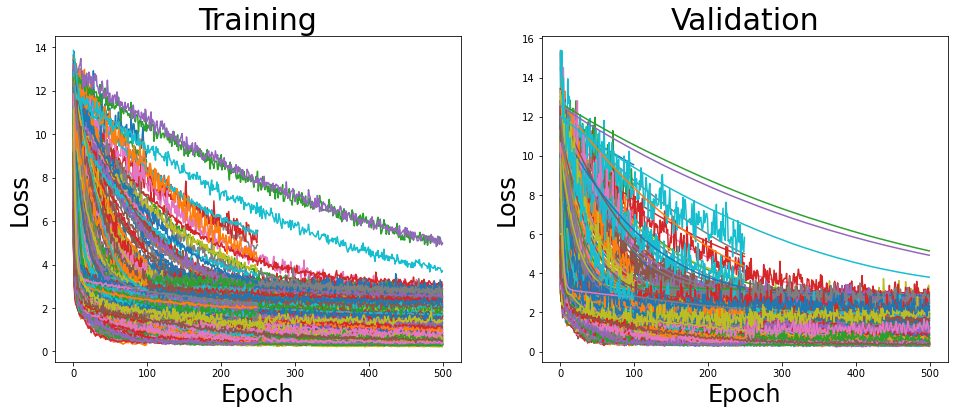

In [20]:
plt.clf()
fig, ax = plt.subplots(1, 2, figsize=(16,6))

for tr_l in train_loss_kf:
    ax[0].plot(tr_l)
    
ax[0].set_ylabel('Loss', fontsize=24)
ax[0].set_xlabel('Epoch', fontsize=24)
ax[0].set_title('Training', fontsize=30)

for val in val_loss_kf:
    ax[1].plot(val)
    
ax[1].set_ylabel('Loss', fontsize=24)
ax[1].set_xlabel('Epoch', fontsize=24)
ax[1].set_title('Validation', fontsize=30)

plt.show()

<Figure size 432x288 with 0 Axes>

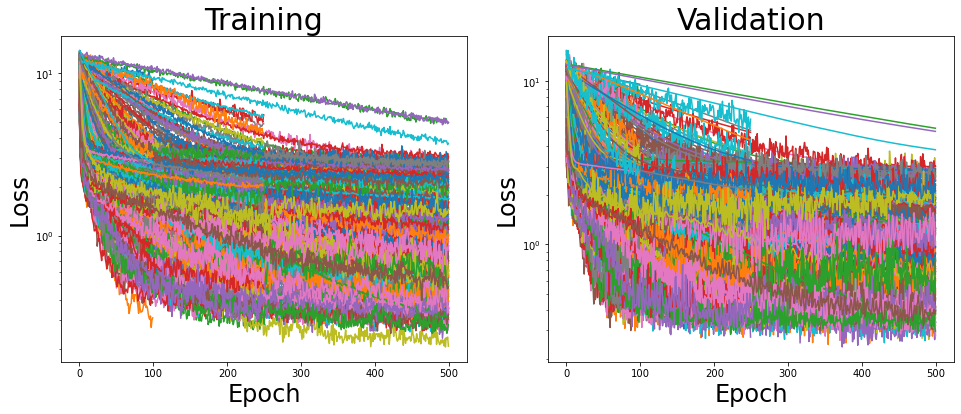

In [35]:
plt.clf()
fig, ax = plt.subplots(1, 2, figsize=(16,6))

for tr_l in train_loss_kf:
    ax[0].semilogy(tr_l)
    
ax[0].set_ylabel('Loss', fontsize=24)
ax[0].set_xlabel('Epoch', fontsize=24)
ax[0].set_title('Training', fontsize=30)

for val in val_loss_kf:
    ax[1].semilogy(val)
    
ax[1].set_ylabel('Loss', fontsize=24)
ax[1].set_xlabel('Epoch', fontsize=24)
ax[1].set_title('Validation', fontsize=30)

plt.show()

## Select best model
According to minumum average validation loss

In [58]:
avg_val_loss = [np.mean(vl) for vl in val_loss_kf]
print('Minimum average validation losses (top 10):', np.sort(avg_val_loss)[:10])

best_net = net_params[np.argmin(avg_val_loss)]
print('Best network parameters:', best_net)

### Dataloaders

In [59]:
b_size = int(best_net['batch_size'])

# train dataloaders
train_dataloader = Data.DataLoader(train_dataset, batch_size=b_size, shuffle=True, num_workers=0)

#test dataloader
val_dataloader  = Data.DataLoader(test_dataset, batch_size=len(test_dataset), shuffle=False, num_workers=0)

### Network training

In [60]:
# define loss function
loss_func = nn.MSELoss()  

# initialization of the net
Ninp, Nhi1, Nhi2, Nout = 1, best_net['Nhi1'], best_net['Nhi2'], 1
net = Net(Ninp, Nhi1, Nhi2, Nout, best_net['dropout']).to(best_net['device'])

# select and set up optimizer
if best_net['optimizer']=='sgd':
    optimizer = optim.SGD(net.parameters(), lr=best_net['learning_rate'], momentum=0.9,
                   weight_decay=best_net['reg_param'])
elif best_net['optimizer']=='adam':
    optimizer = optim.Adam(net.parameters(), lr=best_net['learning_rate'], 
                     weight_decay=best_net['reg_param'])
        
# training
best_train_loss, best_val_loss, my_images = net.fitting(train_dataloader, val_dataloader, optimizer, 
                                                        loss_func, best_net, plot_things=True)


100%|████████████████████████████████████████████████████████████████████████████████| 500/500 [02:08<00:00,  3.89it/s]


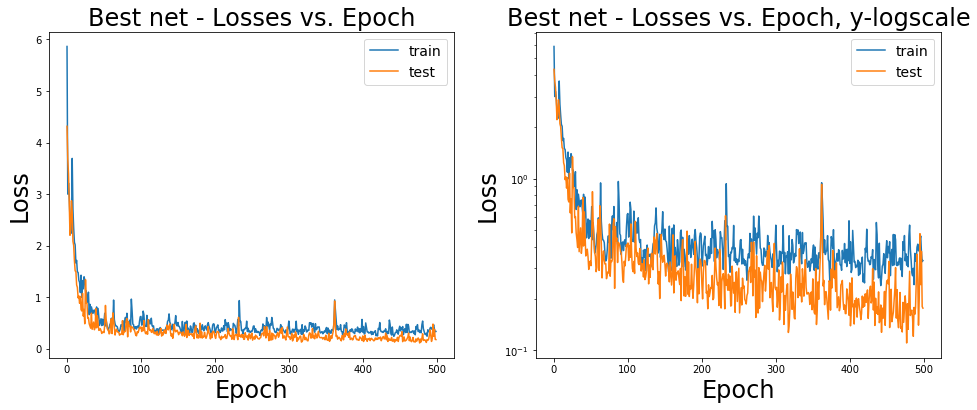

In [65]:
fig, ax = plt.subplots(1,2,figsize=(16,6))

ax[0].set_xlabel('Epoch', fontsize=24)
ax[0].set_ylabel('Loss', fontsize=24)
ax[1].set_xlabel('Epoch', fontsize=24)
ax[1].set_ylabel('Loss', fontsize=24)

ax[0].set_title('Best net - Losses vs. Epoch', fontsize=24)
ax[0].plot(best_train_loss, label='train')
ax[0].plot(best_val_loss, label='test')
ax[0].legend(loc='best', fontsize=14)

ax[1].set_title('Best net - Losses vs. Epoch, y-logscale', fontsize=24)
ax[1].semilogy(best_train_loss, label='train')
ax[1].semilogy(best_val_loss, label='test')
ax[1].legend(loc='best', fontsize=14)

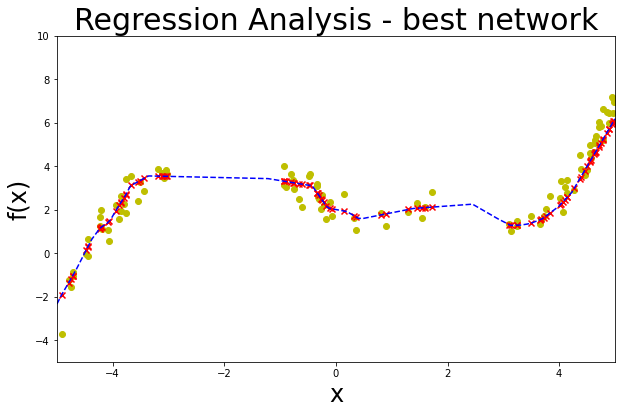

In [63]:
# training dataset: convert to tensors and use Variable from torch.autograd
x = torch.unsqueeze(torch.tensor(train_df.input), dim=1).float()
y = torch.unsqueeze(torch.tensor(train_df.label), dim=1).float()

x, y = Variable(x), Variable(y)

# for plotting the predicted function
x_pred = torch.linspace(-5,5,1000)
x_pred = x_pred.to(device)
x_pred = x_pred.unsqueeze(-1)

net.to(device)

fig, ax = plt.subplots(figsize=(10,6))

plt.cla()
ax.set_title('Regression Analysis - best network', fontsize=30)
ax.set_xlabel('x', fontsize=24)
ax.set_ylabel('f(x)', fontsize=24)
ax.set_xlim(-5, 5)
ax.set_ylim(-5, 10)

ax.scatter(train_df.input, train_df.label, color = 'y')
prediction = net(x)     # input x and predict based on x
# Network output
with torch.no_grad():
    y_pred = net(x_pred)

ax.plot(x_pred.squeeze().cpu().numpy(), y_pred.squeeze().cpu().numpy(), 'b--')
ax.scatter(x.data.numpy(), prediction.data.numpy(), color = 'r', marker = 'x')

plt.savefig('best_net_fitting.png')
plt.show()

In [64]:
# save images as a gif    
imageio.mimsave('./best_net_fitting.gif', my_images, fps=20)

# store best parameters
net_state_dict = net.state_dict()
torch.save(net_state_dict, 'best_net_parameters_reg.torch')
# save the optimizer state
torch.save(optimizer.state_dict(), 'optimizer_state_reg.torch')

## Best networks testing

In [28]:
### Reload the network state

top_net = Net(1, best_net['Nhi1'], best_net['Nhi2'], 1, best_net['dropout'])
# Reload the optimizer state
if best_net['optimizer']=='sgd':
    optimizer = optim.SGD(top_net.parameters(), lr=best_net['learning_rate'], momentum=0.9,
                   weight_decay=best_net['reg_param'])
elif best_net['optimizer']=='adam':
    optimizer = optim.Adam(top_net.parameters(), lr=best_net['learning_rate'], 
                     weight_decay=best_net['reg_param'])

# Load the state dict previously saved
net_state = torch.load('best_net_parameters.torch')

# Update the network parameters
top_net.load_state_dict(net_state)

# re-load also optimizer state
opt_state_dict = torch.load('optimizer_state.torch')
optimizer.load_state_dict(opt_state_dict)


In [66]:
loss_func = nn.MSELoss()
final_test_loss = top_net.testing(test_dataloader, loss_func, device)
print('Average loss of testing procedure for best network:', final_test_loss)

100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 31.98it/s]


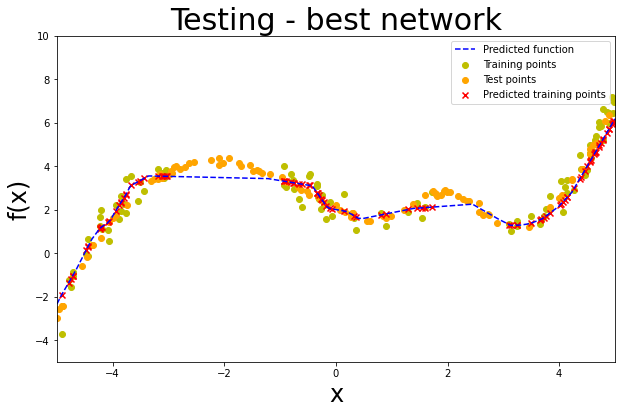

In [67]:
# for plotting the predicted function
x_pred = torch.linspace(-5,5,1000)
x_pred = x_pred.to(device)
x_pred = x_pred.unsqueeze(-1)

net.to(device)

fig, ax = plt.subplots(figsize=(10,6))

plt.cla()
ax.set_title('Testing - best network', fontsize=30)
ax.set_xlabel('x', fontsize=24)
ax.set_ylabel('f(x)', fontsize=24)
ax.set_xlim(-5, 5)
ax.set_ylim(-5, 10)

ax.scatter(train_df.input, train_df.label, color = 'y', label='Training points')
ax.scatter(test_df.input, test_df.label, color = 'orange', label='Test points')

prediction = net(x)     # input x and predict based on x
# Network output
with torch.no_grad():
    y_pred = net(x_pred)

ax.plot(x_pred.squeeze().cpu().numpy(), y_pred.squeeze().cpu().numpy(), 'b--', label='Predicted function')
ax.scatter(x.data.numpy(), prediction.data.numpy(), color = 'r', marker = 'x', label='Predicted training points')
plt.legend(loc='best')
plt.savefig('best_net_testing.png')
plt.show()

## Analysis of weights

In [68]:
# First hidden layer
h1_w = top_net.hl1.weight.data.cpu().numpy()
h1_b = top_net.hl1.bias.data.cpu().numpy()

# Second hidden layer
h2_w = top_net.hl2.weight.data.cpu().numpy()
h2_b = top_net.hl2.bias.data.cpu().numpy()

# Output layer
out_w = top_net.out.weight.data.cpu().numpy()
out_b = top_net.out.bias.data.cpu().numpy()

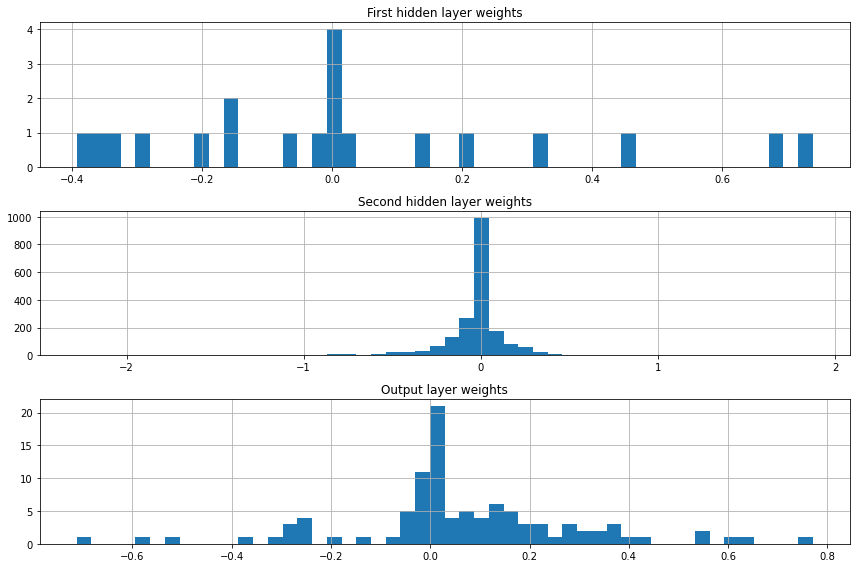

In [69]:
# Weights histogram
fig, axs = plt.subplots(3, 1, figsize=(12,8))
axs[0].hist(h1_w.flatten(), 50)
axs[0].set_title('First hidden layer weights')
axs[1].hist(h2_w.flatten(), 50)
axs[1].set_title('Second hidden layer weights')
axs[2].hist(out_w.flatten(), 50)
axs[2].set_title('Output layer weights')
[ax.grid() for ax in axs]
plt.tight_layout()
plt.show()

## Analysis of activations

In [70]:
def get_activation(layer, input, output):
    global activation
    activation = torch.relu(output)

In [ ]:
### Register hook  
hook_handle = top_net.hl1.register_forward_hook(get_activation)

### Analyze activations
net = top_net.to(device)
net.eval()
with torch.no_grad():
    x1 = torch.tensor([-4]).float().to(device)
    y1 = net(x1)
    z1 = activation
    x2 = torch.tensor([-2]).float().to(device)
    y2 = net(x2)
    z2 = activation
    x3 = torch.tensor([0]).float().to(device)
    y3 = net(x3)
    z3 = activation
    x4 = torch.tensor([2.5]).float().to(device)
    y4 = net(x4)
    z4 = activation

### Remove hook
hook_handle.remove()

### Plot activations
fig, axs = plt.subplots(4, 1, figsize=(12,8))
axs[0].stem(z1.cpu().numpy(), use_line_collection=True)
axs[0].set_title('First layer activations for input x=%.2f' % x1)
axs[1].stem(z2.cpu().numpy(), use_line_collection=True)
axs[1].set_title('First layer activations for input x=%.2f' % x2)
axs[2].stem(z3.cpu().numpy(), use_line_collection=True)
axs[2].set_title('First layer activations for input x=%.2f' % x3)
axs[3].stem(z4.cpu().numpy(), use_line_collection=True)
axs[3].set_title('First layer activations for input x=%.2f' % x4)
plt.tight_layout()
plt.show()

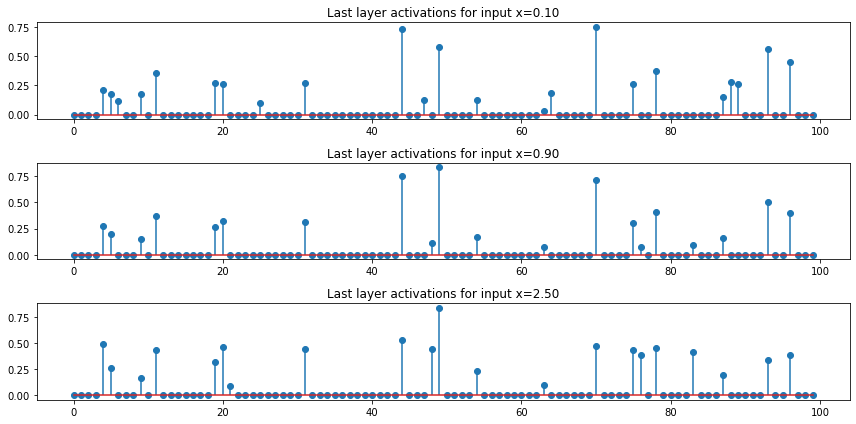

In [71]:
### Register hook  
hook_handle = top_net.hl2.register_forward_hook(get_activation)

### Analyze activations
net = top_net.to(device)
net.eval()
with torch.no_grad():
    x1 = torch.tensor([-4]).float().to(device)
    y1 = top_net(x1)
    z1 = activation
    x2 = torch.tensor([-2]).float().to(device)
    y2 = top_net(x2)
    z2 = activation
    x3 = torch.tensor([0]).float().to(device)
    y3 = top_net(x3)
    z3 = activation
    x4 = torch.tensor([2.5]).float().to(device)
    y4 = top_net(x4)
    z4 = activation

### Remove hook
hook_handle.remove()

### Plot activations
fig, axs = plt.subplots(4, 1, figsize=(12,8))
axs[0].stem(z1.cpu().numpy(), use_line_collection=True)
axs[0].set_title('Last layer activations for input x=%.2f' % x1)
axs[1].stem(z2.cpu().numpy(), use_line_collection=True)
axs[1].set_title('Last layer activations for input x=%.2f' % x2)
axs[2].stem(z3.cpu().numpy(), use_line_collection=True)
axs[2].set_title('Last layer activations for input x=%.2f' % x3)
axs[3].stem(z4.cpu().numpy(), use_line_collection=True)
axs[3].set_title('Last layer activations for input x=%.2f' % x4)
plt.tight_layout()
plt.show()

In [48]:
# other networks params
# best_net = { 'device': device,
#              'batch_size': 32,
#              'dropout': 0.013527054108216433,
#              'num_epochs': 250,
#              'learning_rate': 0.0018730315385064365,
#              'optimizer': 'adam',
#              'Nhi1': 20,
#              'Nhi2': 100,
#              'reg_param': 0.0005193149936590213
#            }

# Best network parameters:
# {
#     'device': device(type='cpu'),
#     'batch_size': 16,
#     'dropout': 0.04208416833667334,
#     'num_epochs': 500,
#     'learning_rate': 0.00354077390896527,
#     'optimizer': 'adam',
#     'Nhi1': 100,
#     'Nhi2': 100,
#     'reg_param': 5.514205739240302e-05
# }

# initialize the network 
# best_net = { 'device': [device],
#              'batch_size': 32,
#              'dropout': 0.013527054108216433,
#              'num_epochs': 250,
#              'learning_rate': 0.0018730315385064365,
#              'optimizer': 'adam',
#              'Nhi1': 20,
#              'Nhi2': 100,
#              'reg_param': 0.0005193149936590213
#            }

# Best network parameters:
# {
#     'device': device(type='cpu'),
#     'batch_size': 10,
#     'dropout': 0.03106212424849699,
#     'num_epochs': 500,
#     'learning_rate': 0.009862521794868784,
#     'optimizer': 'adam',
#     'Nhi1': 20,
#     'Nhi2': 100,
#     'reg_param': 0.00016384336455779847
# }
